<div class="alert alert-info alertinfo" style="text-align:center">
<p style="text-align:center">
    <img src="https://milmujeresia.com/wp-content/uploads/2023/12/logoM1000ia2.png" width="200" alt="Skills Network Logo"  />
    <br>   
    <h1 style="text-align:center"> PROYECTO: DETECCIÓN DE VEHÍCULOS DE EMERGENCIA </h1>

</p>
</div>

<img src="https://www.researchgate.net/profile/Dominik-Notz-2/publication/344722702/figure/fig1/AS:964674333990913@1607007692846/Visualization-of-detected-vehicles-and-their-past-trajectories-in-a-crowded-highway.jpg" width="1600">

In [18]:
# Intalación de la libreria Ultralytics
!pip install ultralytics

In [19]:
!pip install pillow

In [20]:
# Importación de las librerias necesarias
import warnings
warnings.filterwarnings('ignore')
import os
import shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.image as mpimg
import seaborn as sns
import cv2
import yaml
from PIL import Image
from ultralytics import YOLO
from IPython.display import Video
from collections import Counter
from itertools import chain
import random
import statistics

<hr/>
<div class="alert alert-info alertinfo" style="margin-top: 20px">
    <h2> Análisis Exploratorio de Datos (EDA) </h2>   
</div>
<hr/>

## Se importa el dataset usando la librería os

In [21]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [22]:
# Ruta de las carpetas de imágenes y etiquetas de los datos TRAIN y TEST
images_folder_train = '/content/drive/My Drive/Cars Detection/train/images'
labels_folder_train = '/content/drive/My Drive/Cars Detection/train/labels'
images_folder_valid = '/content/drive/My Drive/Cars Detection/valid/images'
labels_folder_valid = '/content/drive/My Drive/Cars Detection/valid/labels'
images_folder_test = '/content/drive/My Drive/Cars Detection/test/images'
labels_folder_test = '/content/drive/My Drive/Cars Detection/test/labels'

In [23]:
# Lista para almacenar las rutas de las imágenes y etiquetas
image_paths_train = []
label_paths_train = []
image_paths_valid = []
label_paths_valid = []
image_paths_test = []
label_paths_test = []

In [24]:
# Función para leer las etiquetas de los archivos de texto
def read_labels(label_path):
    with open(label_path, 'r') as file:
        labels = [line.strip().split() for line in file]
    return labels

In [25]:
# Obtener las rutas de las imágenes y etiquetas de train
for filename in os.listdir(images_folder_train):
    if filename.endswith('.jpg'):
        image_path_train = os.path.join(images_folder_train, filename)
        label_path_train = os.path.join(labels_folder_train, filename[:-4] + '.txt')
        if os.path.exists(label_path_train):
            image_paths_train.append(image_path_train)
            label_paths_train.append(label_path_train)

# Se crea el dataset train combinando las imágenes y etiquetas
dataset_train = []
for image_path_train, label_path_train in zip(image_paths_train, label_paths_train):
    image = Image.open(image_path_train)
    labels = read_labels(label_path_train)
    dataset_train.append((image, labels))

In [26]:
# Obtener las rutas de las imágenes y etiquetas de valid
for filename in os.listdir(images_folder_valid):
    if filename.endswith('.jpg'):
        image_path_valid = os.path.join(images_folder_valid, filename)
        label_path_valid = os.path.join(labels_folder_valid, filename[:-4] + '.txt')
        if os.path.exists(label_path_valid):
            image_paths_valid.append(image_path_valid)
            label_paths_valid.append(label_path_valid)

# Se crea el dataset valid combinando las imágenes y etiquetas
dataset_valid = []
for image_path_valid, label_path_valid in zip(image_paths_valid, label_paths_valid):
    image = Image.open(image_path_valid)
    labels = read_labels(label_path_valid)
    dataset_valid.append((image, labels))

In [27]:
# Obtener las rutas de las imágenes y etiquetas de test
for filename in os.listdir(images_folder_test):
    if filename.endswith('.jpg'):
        image_path_test = os.path.join(images_folder_test, filename)
        label_path_test = os.path.join(labels_folder_test, filename[:-4] + '.txt')
        if os.path.exists(label_path_test):
            image_paths_test.append(image_path_test)
            label_paths_test.append(label_path_test)

# Se crea el dataset test combinando imágenes y etiquetas
dataset_test = []
for image_path_test, label_path_test in zip(image_paths_test, label_paths_test):
    image = Image.open(image_path_test)
    labels = read_labels(label_path_test)
    dataset_test.append((image, labels))

## El dataset está conformado por 1254 imágenes, 878 imágenes para train, 250 imágenes de validación y 126 imágenes para test

In [28]:
num_images_train = len(dataset_train)
num_images_valid = len(dataset_valid)
num_images_test = len(dataset_test)
print("Número de imágenes en el dataset train:", num_images_train)
print("Número de imágenes en el dataset valid:", num_images_valid)
print("Número de imágenes en el dataset test:", num_images_test)
print(f"Volumen del dataset: {num_images_train+num_images_test+num_images_valid}")

Número de imágenes en el dataset train: 878
Número de imágenes en el dataset valid: 250
Número de imágenes en el dataset test: 126
Volumen del dataset: 1254


## Las imágenes tienen una resolución de 416 x 416 píxeles

In [ ]:
resolutions_train = [image.size for image, _ in dataset_train]
unique_resolutions_train = set(resolutions_train)
resolutions_valid = [image.size for image, _ in dataset_valid]
unique_resolutions_valid = set(resolutions_valid)
resolutions_test = [image.size for image, _ in dataset_test]
unique_resolutions_test = set(resolutions_test)
print("Resoluciones únicas de las imágenes train:", unique_resolutions_train)
print("Resoluciones únicas de las imágenes valid:", unique_resolutions_valid)
print("Resoluciones únicas de las imágenes test:", unique_resolutions_test)

Resoluciones únicas de las imágenes train: {(416, 416)}
Resoluciones únicas de las imágenes valid: {(416, 416)}
Resoluciones únicas de las imágenes test: {(416, 416)}


## Representación gráfica de una imagen del conjuento de datos train seleccionada al azar con su etiqueta correspondiente

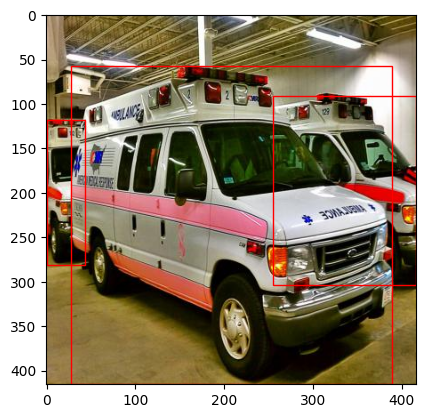

In [ ]:
# Se selecciona un índice aleatorio
random_index = random.randint(0, len(dataset_train) - 1)

# Se selecciona una imagen y su etiqueta correspondiente
image, labels = dataset_train[random_index]

# Creación de una figura y sus ejes para mostrar la imagen y su etiqueta
fig, ax = plt.subplots()
ax.imshow(image)


for label in labels:
    class_id, x_center, y_center, width, height = map(float, label)

    x1 = (x_center - width / 2) * image.width
    y1 = (y_center - height / 2) * image.height
    w = width * image.width
    h = height * image.height

    rect = patches.Rectangle((x1, y1), w, h, linewidth=1, edgecolor='r', facecolor='none')
    ax.add_patch(rect)

plt.show()

## Representación gráfica de una imagen del conjuento de datos valid seleccionada al azar con su etiqueta correspondiente

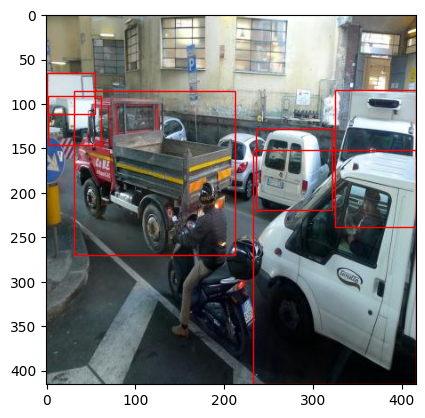

In [ ]:
# Se selecciona un índice aleatorio
random_index = random.randint(0, len(dataset_valid) - 1)

# Se selecciona una imagen y su etiqueta correspondiente
image, labels = dataset_valid[random_index]

# Creación de una figura y sus ejes para mostrar la imagen y su etiqueta
fig, ax = plt.subplots()
ax.imshow(image)


for label in labels:
    class_id, x_center, y_center, width, height = map(float, label)

    x1 = (x_center - width / 2) * image.width
    y1 = (y_center - height / 2) * image.height
    w = width * image.width
    h = height * image.height

    rect = patches.Rectangle((x1, y1), w, h, linewidth=1, edgecolor='r', facecolor='none')
    ax.add_patch(rect)

plt.show()

## Representación gráfica de una imagen del conjuento de datos test seleccionada al azar con su etiqueta correspondiente

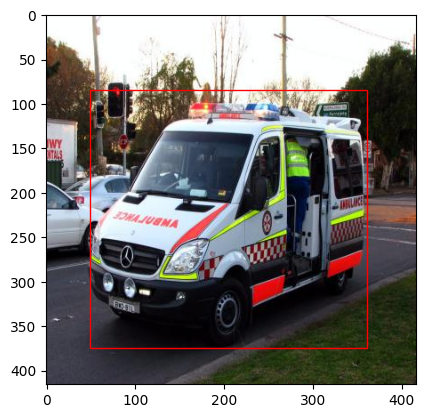

In [ ]:
# Se selecciona un índice aleatorio
random_index = random.randint(0, len(dataset_test) - 1)

# Se selecciona una imagen y su etiqueta correspondiente
image, labels = dataset_test[random_index]

# Creación de una figura y sus ejes para mostrar la imagen y su etiqueta
fig, ax = plt.subplots()
ax.imshow(image)


for label in labels:
    class_id, x_center, y_center, width, height = map(float, label)

    x1 = (x_center - width / 2) * image.width
    y1 = (y_center - height / 2) * image.height
    w = width * image.width
    h = height * image.height

    rect = patches.Rectangle((x1, y1), w, h, linewidth=1, edgecolor='r', facecolor='none')
    ax.add_patch(rect)

plt.show()

## Matriz de 5x5 para mostrar las primeras 25 imágenes del conjunto de datos train

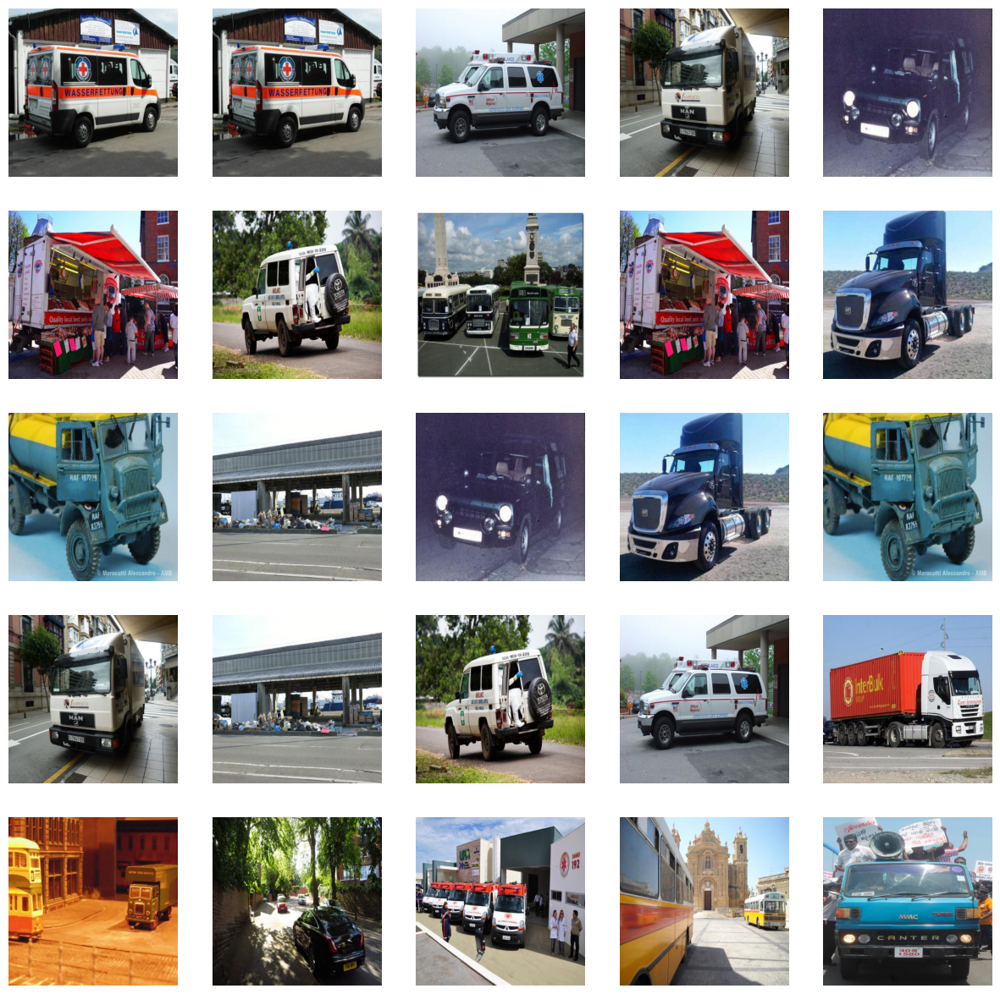

In [ ]:
fig, axes = plt.subplots(5, 5, figsize=(15, 15))
for i in range(25):
    row = i // 5
    col = i % 5
    image, _ = dataset_train[i]
    axes[row, col].imshow(image)
    axes[row, col].axis('off')
plt.show()

## Se observa que todas las imágenes presentan el mismo tamaño de imagen  

In [ ]:
sns.set(rc={'axes.facecolor': '#eae8fa'}, style='darkgrid')

Número de resoluciones únicas: 878
Resoluciones únicas: {(416, 416)}
Estadísticas resumidas del tamaño de las imágenes:
Media: 416.0
Mediana: 416.0
Desviación estándar: 0.0
Mínimo: 416
Máximo: 416


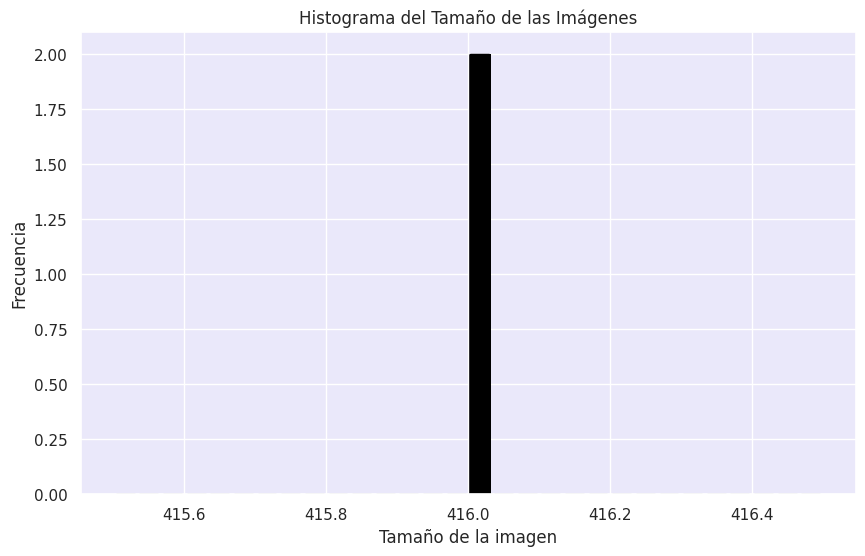

In [ ]:
# Cálculo de algunas estadísticas resumidas del tamaño de las imágenes
image_sizes = [image.size for image, _ in dataset_train]
unique_resolutions = set(image_sizes)
num_unique_resolutions = len(image_sizes)
mean_size = np.mean(image_sizes)
median_size = np.median(image_sizes)
std_size = np.std(image_sizes)
min_size = np.min(image_sizes)
max_size = np.max(image_sizes)

print("Número de resoluciones únicas:", num_unique_resolutions)
print("Resoluciones únicas:", unique_resolutions)
print("Estadísticas resumidas del tamaño de las imágenes:")
print("Media:", mean_size)
print("Mediana:", median_size)
print("Desviación estándar:", std_size)
print("Mínimo:", min_size)
print("Máximo:", max_size)

# Histograma del tamaño de las imágenes
plt.figure(figsize=(10, 6))
plt.hist(image_sizes, bins=30, edgecolor='black')
plt.xlabel('Tamaño de la imagen')
plt.ylabel('Frecuencia')
plt.title('Histograma del Tamaño de las Imágenes')
plt.grid(True)
plt.show()

## Se verifica la existencia de datos faltantes

In [ ]:
# lista de nombres de archivos de imágenes y etiquetas train
image_filenames = [os.path.splitext(filename)[0] for filename in os.listdir(images_folder_train)]
label_filenames = [os.path.splitext(filename)[0] for filename in os.listdir(labels_folder_train)]

# Verificación si alguna imagen no tiene su etiqueta correspondiente
missing_labels = set(image_filenames) - set(label_filenames)
if missing_labels:
    print("Las siguientes imágenes no tienen etiquetas correspondientes:")
    print(missing_labels)
else:
    print("Todas las imágenes del dataset train tienen etiquetas correspondientes.")

# Se carga las etiquetas en un DataFrame de pandas
label_data_train = []
for filename in label_filenames:
    label_path = os.path.join(labels_folder_train, filename + '.txt')
    with open(label_path, 'r') as file:
        labels = [line.strip().split() for line in file]
    label_data_train.extend(labels)

label_df_train = pd.DataFrame(label_data_train, columns=['class_id', 'x_center', 'y_center', 'width', 'height'])

# Se verifica si hay datos faltantes en el DataFrame
missing_data = label_df_train.isnull().sum()
if missing_data.any():
    print("\nSe encontraron datos faltantes:")
    print(missing_data)
else:
    print("\nNo se encontraron datos faltantes en las etiquetas del dataset train.")

Todas las imágenes del dataset train tienen etiquetas correspondientes.

No se encontraron datos faltantes en las etiquetas del dataset train.


In [ ]:
# lista de nombres de archivos de imágenes y etiquetas test
image_filenames = [os.path.splitext(filename)[0] for filename in os.listdir(images_folder_test)]
label_filenames = [os.path.splitext(filename)[0] for filename in os.listdir(labels_folder_test)]

# Verificación si alguna imagen no tiene su etiqueta correspondiente
missing_labels = set(image_filenames) - set(label_filenames)
if missing_labels:
    print("Las siguientes imágenes no tienen etiquetas correspondientes:")
    print(missing_labels)
else:
    print("Todas las imágenes del dataset test tienen etiquetas correspondientes.")

# Se carga las etiquetas en un DataFrame de pandas
label_data_test = []
for filename in label_filenames:
    label_path = os.path.join(labels_folder_test, filename + '.txt')
    with open(label_path, 'r') as file:
        labels = [line.strip().split() for line in file]
    label_data_test.extend(labels)

label_df_test = pd.DataFrame(label_data_test, columns=['class_id', 'x_center', 'y_center', 'width', 'height'])

# Se verifica si hay datos faltantes en el DataFrame
missing_data = label_df_test.isnull().sum()
if missing_data.any():
    print("\nSe encontraron datos faltantes:")
    print(missing_data)
else:
    print("\nNo se encontraron datos faltantes en las etiquetas del dataset test.")

Todas las imágenes del dataset test tienen etiquetas correspondientes.

No se encontraron datos faltantes en las etiquetas del dataset test.


## Cada imagen viene acompañada de una etiqueta, que proporciona detalles sobre la clase del objeto (en este caso 0: ‘Ambulancia’, 1: ‘Bus’, 2: ‘Auto’, 3: ‘Moto’, 4: ‘Camión’ ), la ubicación mediante coordenadas y las dimensiones (ancho x alto) de los vehículos presentes en la imagen. [class_id, x_center, y_center, width, height]

In [ ]:
# Función para obtener las clases
def get_classes(dataset):
    classes = set()
    for _, labels in dataset:
        for label in labels:
            classes.add(label[0])
    return classes

# Obtención de clases
classes_train = get_classes(dataset_train)
classes_test = get_classes(dataset_test)

print("Clases en el conjunto de datos de entrenamiento:", classes_train)
print("Clases en el conjunto de datos de prueba:", classes_test)

Clases en el conjunto de datos de entrenamiento: {'2', '4', '3', '1', '0'}
Clases en el conjunto de datos de prueba: {'2', '4', '3', '1', '0'}


In [ ]:
# Se imprime las etiquetas para verificar su formato
for label in labels:
    print(label)

['2', '0.7788461538461539', '0.6382211538461539', '0.22716346153846154', '0.16826923076923078']


## Los datos correspondientes a la etiqueta se encuentran normalizados, dentro del rango de entre 0 y 1

In [ ]:
# Función para verificar formato
def check_label_format(labels):
    correct_format = True

    for label in labels:
        if len(label) != 5:
            correct_format = False
            break
        class_id, x_center, y_center, width, height = map(float, label)
        if not (0 <= x_center <= 1 and 0 <= y_center <= 1 and 0 <= width <= 1 and 0 <= height <= 1):
            correct_format = False
            break

    return correct_format

# Verificar el formato y rango de las etiquetas
correct_format = check_label_format(labels)

if correct_format:
    print("Todas las etiquetas tienen el mismo formato y están dentro del rango esperado.")
else:
    print("¡Advertencia! Al menos una etiqueta no tiene el formato correcto o está fuera del rango esperado.")

Todas las etiquetas tienen el mismo formato y están dentro del rango esperado.


## A continuación, se realiza la estadística descriptiva del número de etiquetas por imagen y de las coordenadas y dimensiones de cada vehículo en las etiquetas del dataset train

Estadísticas de número de etiquetas por imagen:
Media: 1.9088838268792712
Mediana: 1.0
Mínimo: 1
Máximo: 9
Moda: 1



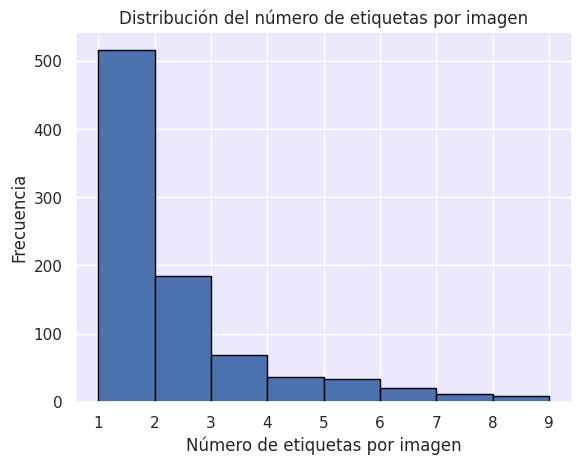

In [ ]:
# Se obtiene el número de etiquetas por imagen
num_labels_per_image = [len(labels) for _, labels in dataset_train]

# Estadísticas descriptivas del número de etiquetas por imagen
min_labels = np.min(num_labels_per_image)
max_labels = np.max(num_labels_per_image)
avg_labels = np.mean(num_labels_per_image)
median_labels = np.median(num_labels_per_image)
mode_labels = statistics.mode(num_labels_per_image)

print("Estadísticas de número de etiquetas por imagen:")
print("Media:", avg_labels)
print("Mediana:", median_labels)
print("Mínimo:", min_labels)
print("Máximo:", max_labels)
print("Moda:", mode_labels)
print()

#  histograma de la distribución del número de etiquetas
plt.hist(num_labels_per_image, bins=range(min_labels, max_labels+1), edgecolor='black')
plt.xlabel('Número de etiquetas por imagen')
plt.ylabel('Frecuencia')
plt.title('Distribución del número de etiquetas por imagen')
plt.grid(True)
plt.show()

In [ ]:
# Se extrae solo las etiquetas del conjunto de entrenamiento
train_labels = [labels for _, labels in dataset_train]

# Se crean listas para almacenar las coordenadas y dimensiones
x_coordinates = []
y_coordinates = []
widths = []
heights = []

# Se recorre cada etiqueta del conjunto de entrenamiento
for labels in train_labels:
    for label in labels:
        label = [float(value) for value in label]
        x, y, w, h = label[1:]
        x_coordinates.append(x)
        y_coordinates.append(y)
        widths.append(w)
        heights.append(h)

# Se convierten las listas a arrays
x_coordinates = np.array(x_coordinates)
y_coordinates = np.array(y_coordinates)
widths = np.array(widths)
heights = np.array(heights)

# Cálculo de las estadísticas descriptivas
x_mean = np.mean(x_coordinates)
y_mean = np.mean(y_coordinates)
width_mean = np.mean(widths)
height_mean = np.mean(heights)

x_median = np.median(x_coordinates)
y_median = np.median(y_coordinates)
width_median = np.median(widths)
height_median = np.median(heights)

x_min = np.min(x_coordinates)
y_min = np.min(y_coordinates)
width_min = np.min(widths)
height_min = np.min(heights)

x_max = np.max(x_coordinates)
y_max = np.max(y_coordinates)
width_max = np.max(widths)
height_max = np.max(heights)

x_std = np.std(x_coordinates)
y_std = np.std(y_coordinates)
width_std = np.std(widths)
height_std = np.std(heights)

print("Estadísticas de coordenada x:")
print("Media:", x_mean)
print("Mediana:", x_median)
print("Mínimo:", x_min)
print("Máximo:", x_max)
print("Desviación estándar:", x_std)
print()

print("Estadísticas de coordenada y:")
print("Media:", y_mean)
print("Mediana:", y_median)
print("Mínimo:", y_min)
print("Máximo:", y_max)
print("Desviación estándar:", y_std)
print()

print("Estadísticas de ancho:")
print("Media:", width_mean)
print("Mediana:", width_median)
print("Mínimo:", width_min)
print("Máximo:", width_max)
print("Desviación estándar:", width_std)
print()

print("Estadísticas de altura:")
print("Media:", height_mean)
print("Mediana:", height_median)
print("Mínimo:", height_min)
print("Máximo:", height_max)
print("Desviación estándar:", height_std)

Estadísticas de coordenada x:
Media: 0.49869480906921243
Mediana: 0.5
Mínimo: 0.019230769230769232
Máximo: 0.9939903846153846
Desviación estándar: 0.2566569475837725

Estadísticas de coordenada y:
Media: 0.5045466541215348
Mediana: 0.5102163461538461
Mínimo: 0.021634615384615384
Máximo: 0.9074519230769231
Desviación estándar: 0.1719523656387342

Estadísticas de ancho:
Media: 0.3932913186157518
Mediana: 0.2938701923076923
Mínimo: 0.010817307692307692
Máximo: 0.9987980769230769
Desviación estándar: 0.3032058395975268

Estadísticas de altura:
Media: 0.3792870502111254
Mediana: 0.30588942307692313
Mínimo: 0.010817307692307692
Máximo: 0.9987980769230769
Desviación estándar: 0.278887354570203


## A continuación, se realizan histográmas y boxplot para observar la distribución de los datos

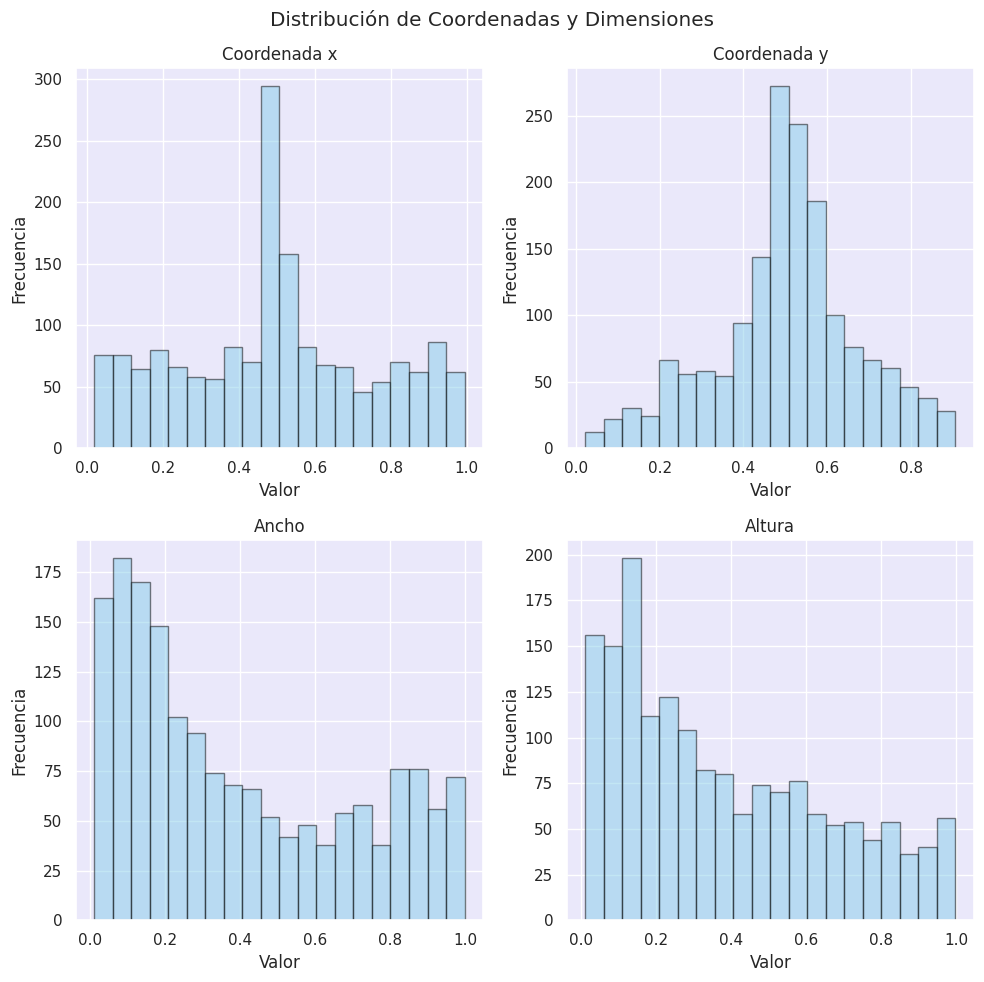

In [ ]:
# Datos
data = {
    'Coordenada x': x_coordinates,
    'Coordenada y': y_coordinates,
    'Ancho': widths,
    'Altura': heights
}

# Creación de histogramas
fig, axs = plt.subplots(2, 2, figsize=(10, 10))

for (var, values), ax in zip(data.items(), axs.flatten()):
    # Crear el histograma
    ax.hist(values, bins=20, alpha=0.5, color='skyblue', edgecolor='black')
    ax.set_title(var)
    ax.set_xlabel('Valor')
    ax.set_ylabel('Frecuencia')

plt.suptitle('Distribución de Coordenadas y Dimensiones')
plt.tight_layout()
plt.show()

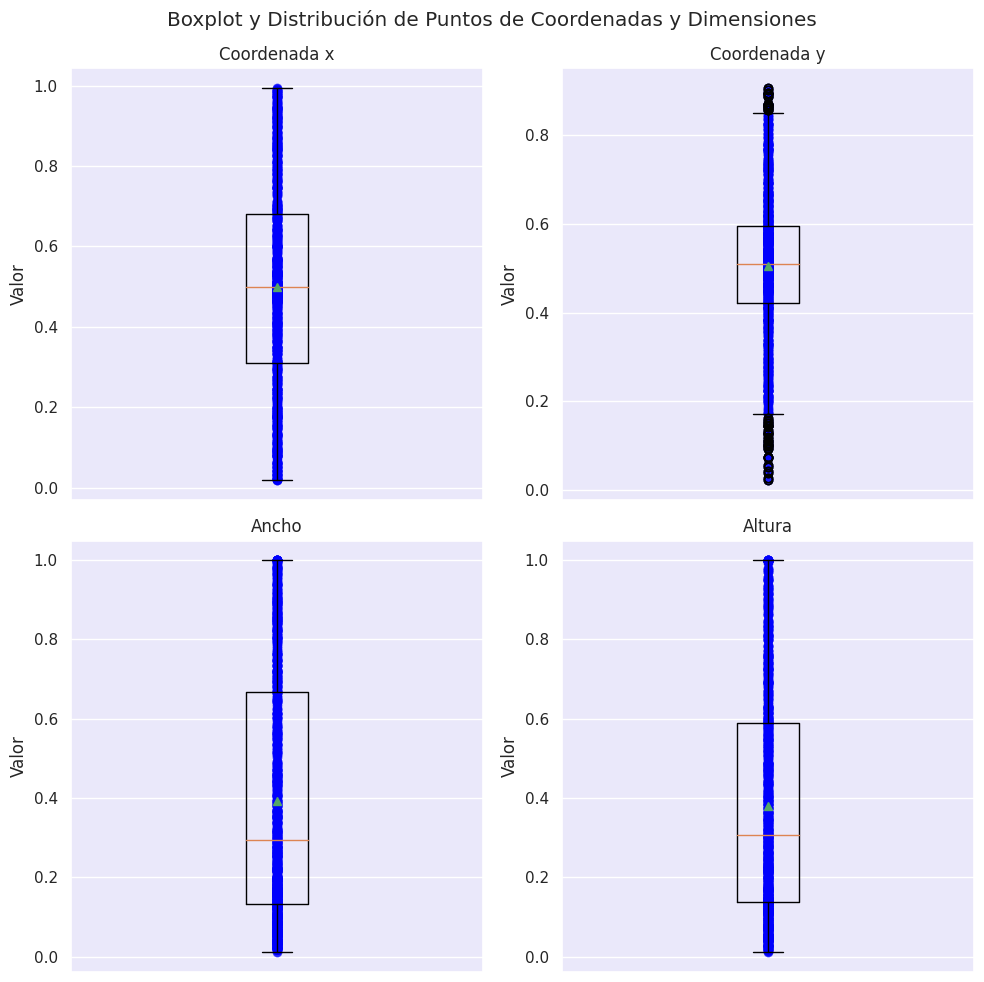

In [ ]:
# Datos
data = {
    'Coordenada x': x_coordinates,
    'Coordenada y': y_coordinates,
    'Ancho': widths,
    'Altura': heights
}

# Creación de boxplot
fig, axs = plt.subplots(2, 2, figsize=(10, 10))

for (var, values), ax in zip(data.items(), axs.flatten()):
    ax.boxplot(values, showmeans=True)
    ax.scatter([1]*len(values), values, alpha=0.4, color='blue')
    ax.set_title(var)
    ax.set_ylabel('Valor')
    ax.set_xticks([])

plt.suptitle('Boxplot y Distribución de Puntos de Coordenadas y Dimensiones')
plt.tight_layout()
plt.show()

## Correlación de caracterísiticas (features)

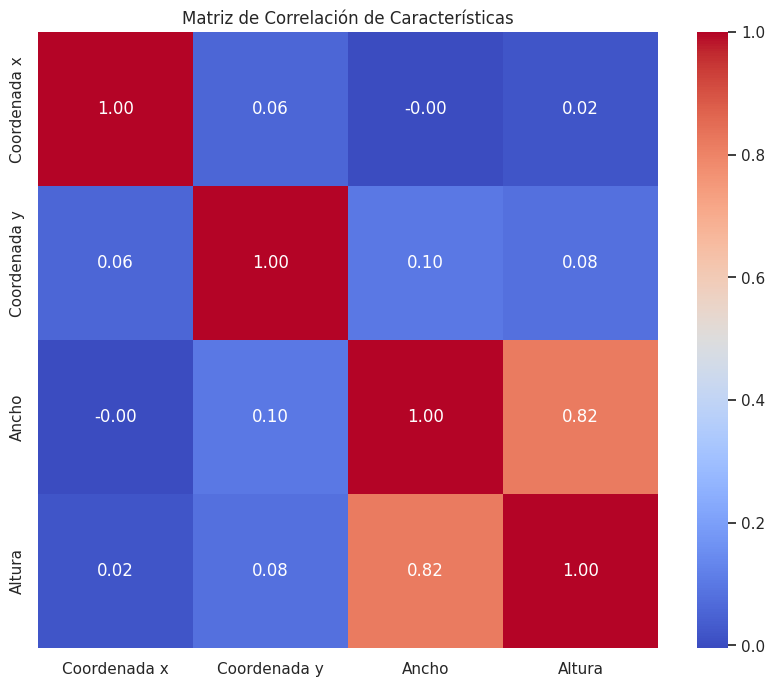

In [ ]:
# Se crea un DataFrame con las características
data = {
    'Coordenada x': x_coordinates,
    'Coordenada y': y_coordinates,
    'Ancho': widths,
    'Altura': heights
}

df = pd.DataFrame(data)

# matriz de correlación
correlation_matrix = df.corr()

# Visualización de la matriz de correlación utilizando un mapa de calor
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Matriz de Correlación de Características')
plt.show()

## Comparación de distribución entre el conjunto de datos train y test

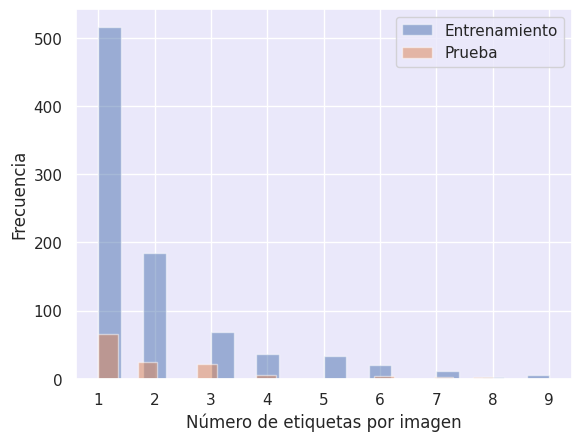

In [ ]:
# Número de etiquetas por imagen en cada conjunto de datos
num_labels_per_image_train = [len(labels) for _, labels in dataset_train]
num_labels_per_image_test = [len(labels) for _, labels in dataset_test]

# Comparación de distribución del número de etiquetas por imagen
plt.hist(num_labels_per_image_train, bins=20, alpha=0.5, label='Entrenamiento')
plt.hist(num_labels_per_image_test, bins=20, alpha=0.5, label='Prueba')
plt.xlabel('Número de etiquetas por imagen')
plt.ylabel('Frecuencia')
plt.legend()
plt.show()

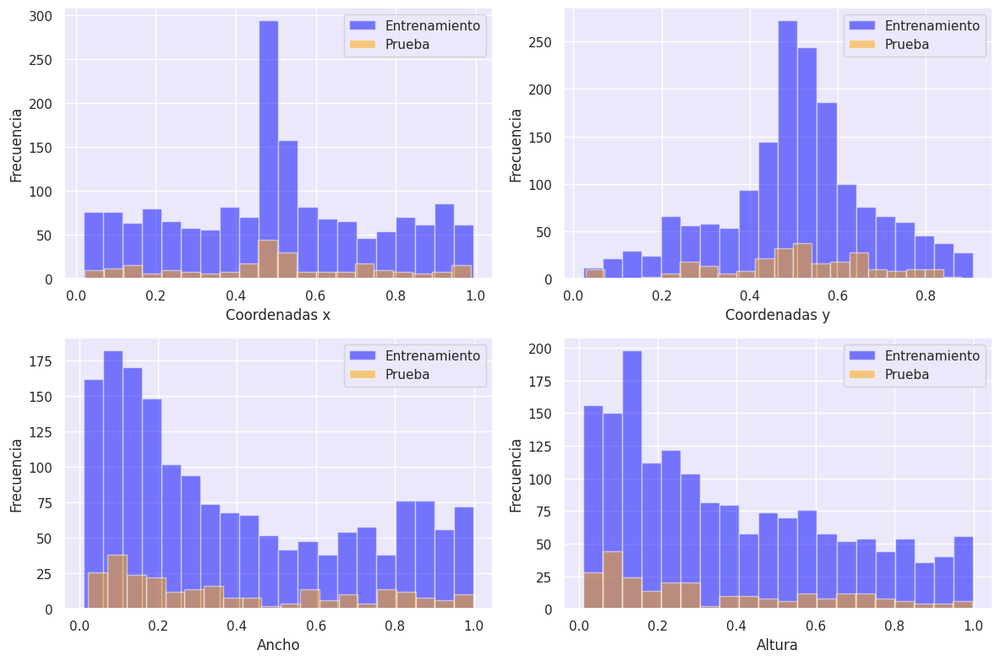

In [ ]:
# Se obtiene las coordenadas x, y, anchos y alturas del conjunto de entrenamiento
x_coordinates_train = [float(label[1]) for _, labels in dataset_train for label in labels]
y_coordinates_train = [float(label[2]) for _, labels in dataset_train for label in labels]
widths_train = [float(label[3]) for _, labels in dataset_train for label in labels]
heights_train = [float(label[4]) for _, labels in dataset_train for label in labels]

# Se obtiene las coordenadas x, y, anchos y alturas del conjunto de prueba
x_coordinates_test = [float(label[1]) for _, labels in dataset_test for label in labels]
y_coordinates_test = [float(label[2]) for _, labels in dataset_test for label in labels]
widths_test = [float(label[3]) for _, labels in dataset_test for label in labels]
heights_test = [float(label[4]) for _, labels in dataset_test for label in labels]

# Crear una matriz de 2x2 para mostrar los histogramas
plt.figure(figsize=(12, 8))

# Comparación de coordenadas x
plt.subplot(2, 2, 1)
plt.hist(x_coordinates_train, bins=20, alpha=0.5, color='blue', label='Entrenamiento')
plt.hist(x_coordinates_test, bins=20, alpha=0.5, color='orange', label='Prueba')
plt.xlabel('Coordenadas x')
plt.ylabel('Frecuencia')
plt.legend()

# Comparación de coordenadas y
plt.subplot(2, 2, 2)
plt.hist(y_coordinates_train, bins=20, alpha=0.5, color='blue', label='Entrenamiento')
plt.hist(y_coordinates_test, bins=20, alpha=0.5, color='orange', label='Prueba')
plt.xlabel('Coordenadas y')
plt.ylabel('Frecuencia')
plt.legend()

# Comparación de anchos
plt.subplot(2, 2, 3)
plt.hist(widths_train, bins=20, alpha=0.5, color='blue', label='Entrenamiento')
plt.hist(widths_test, bins=20, alpha=0.5, color='orange', label='Prueba')
plt.xlabel('Ancho')
plt.ylabel('Frecuencia')
plt.legend()

# Comparación de alturas
plt.subplot(2, 2, 4)
plt.hist(heights_train, bins=20, alpha=0.5, color='blue', label='Entrenamiento')
plt.hist(heights_test, bins=20, alpha=0.5, color='orange', label='Prueba')
plt.xlabel('Altura')
plt.ylabel('Frecuencia')
plt.legend()

plt.tight_layout()
plt.show()

<hr/>
<div class="alert alert-info alertinfo" style="margin-top: 20px">
    <h2> MODELADO </h2>   
</div>
<hr/>

## Se eligió la arquitectura YOLOv8 debido a su eficacia y rendimiento en la detección de objetos en imágenes.Se entrenaran tres modelos utilizando diferentes variantes de YOLOv8: YOLOv8n, YOLOv8s y YOLOv8m.

In [ ]:
# Hiperparámetros del modelo
epoch_traning = 100
path_yaml = '/content/drive/My Drive/Cars Detection/data.yaml'
patience = 10

<hr/>
<div class="alert alert-info alertinfo" style="margin-top: 20px">
    <h2> ENTRENAMIENTO DEL MODELO </h2>   
</div>
<hr/>

## Entrenamiento con arquitectura de Yolov8n, Yolov8s, y Yolov8m

In [ ]:
# Entrenamos YOLOv8n
model_v8n = YOLO('yolov8n.pt')
results_v8n = model_v8n.train(data=path_yaml, epochs=epoch_traning, imgsz=416, patience=patience)

# Entrenamos YOLOv8s
model_v8s = YOLO('yolov8s.pt')
results_v8s = model_v8s.train(data=path_yaml, epochs=epoch_traning, imgsz=416, patience=patience)

# Entrenamos YOLOv8m
model_v8m = YOLO('yolov8m.pt')
results_v8m = model_v8m.train(data=path_yaml, epochs=epoch_traning, imgsz=416, patience=patience)

100%|██████████| 6.23M/6.23M [00:00<00:00, 22.7MB/s]


Ultralytics YOLOv8.2.30 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/drive/My Drive/Cars Detection/data.yaml, epochs=100, time=None, patience=10, batch=16, imgsz=416, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True,

100%|██████████| 755k/755k [00:00<00:00, 4.35MB/s]


Overriding model.yaml nc=80 with nc=5

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

train: Scanning /content/drive/My Drive/Cars Detection/train/labels.cache... 878 images, 0 backgrounds, 0 corrupt: 100%|██████████| 878/878 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/drive/My Drive/Cars Detection/valid/labels.cache... 250 images, 0 backgrounds, 0 corrupt: 100%|██████████| 250/250 [00:00<?, ?it/s]


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 416 train, 416 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      1.18G      1.119      2.781      1.306         52        416: 100%|██████████| 55/55 [00:19<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.17it/s]

                   all        250        454      0.507      0.344      0.368      0.274



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      1.02G      1.217      2.104      1.372         49        416: 100%|██████████| 55/55 [00:15<00:00,  3.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.43it/s]

                   all        250        454      0.345      0.432      0.313      0.198



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      1.01G      1.228      2.042      1.376         57        416: 100%|██████████| 55/55 [00:15<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.41it/s]

                   all        250        454      0.322      0.296      0.239      0.143



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      1.02G      1.255      1.995      1.363         64        416: 100%|██████████| 55/55 [00:15<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.31it/s]

                   all        250        454      0.307      0.347      0.281      0.176



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      1.02G      1.218      1.867      1.334         43        416: 100%|██████████| 55/55 [00:15<00:00,  3.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.56it/s]

                   all        250        454      0.585      0.292      0.346      0.227



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      1.02G      1.179      1.798      1.323         44        416: 100%|██████████| 55/55 [00:18<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.02it/s]

                   all        250        454      0.365      0.393      0.373      0.245



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      1.01G       1.16       1.76      1.319         63        416: 100%|██████████| 55/55 [00:13<00:00,  4.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.84it/s]

                   all        250        454      0.396      0.504      0.436      0.277



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      1.01G      1.176      1.709      1.311         41        416: 100%|██████████| 55/55 [00:12<00:00,  4.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.87it/s]

                   all        250        454      0.503       0.37      0.449      0.314



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      1.01G      1.126      1.631      1.287         58        416: 100%|██████████| 55/55 [00:12<00:00,  4.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.85it/s]

                   all        250        454      0.457      0.443      0.416      0.291



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      1.01G      1.105      1.531      1.273         63        416: 100%|██████████| 55/55 [00:12<00:00,  4.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.23it/s]

                   all        250        454      0.586      0.506      0.527      0.354



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      1.01G      1.084      1.496      1.264         40        416: 100%|██████████| 55/55 [00:13<00:00,  4.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.07it/s]

                   all        250        454      0.685      0.389       0.47      0.328



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      1.02G      1.085      1.461      1.261         64        416: 100%|██████████| 55/55 [00:13<00:00,  4.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.20it/s]

                   all        250        454      0.536      0.384      0.455      0.315



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      1.01G      1.051      1.393      1.234         55        416: 100%|██████████| 55/55 [00:13<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.11it/s]

                   all        250        454       0.46      0.502      0.485      0.335



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      1.02G      1.068      1.419      1.247         34        416: 100%|██████████| 55/55 [00:15<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.61it/s]

                   all        250        454      0.633      0.404      0.455      0.325



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      1.01G      1.084       1.41      1.245         59        416: 100%|██████████| 55/55 [00:15<00:00,  3.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.62it/s]

                   all        250        454      0.684      0.389      0.475      0.319



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      1.02G       1.06       1.37      1.235         38        416: 100%|██████████| 55/55 [00:15<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.65it/s]

                   all        250        454      0.433      0.521      0.465      0.327



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      1.02G      1.049      1.376      1.237         62        416: 100%|██████████| 55/55 [00:15<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.78it/s]

                   all        250        454      0.586      0.438      0.497      0.353



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      1.02G      1.021      1.277      1.221         68        416: 100%|██████████| 55/55 [00:19<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.49it/s]

                   all        250        454      0.585       0.53      0.552      0.399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      1.02G      1.013      1.242      1.207         47        416: 100%|██████████| 55/55 [00:15<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.83it/s]


                   all        250        454      0.473      0.492      0.483      0.326

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      1.01G      1.038      1.281       1.22         56        416: 100%|██████████| 55/55 [00:15<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.52it/s]


                   all        250        454      0.623       0.51      0.529       0.37

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      1.02G     0.9792       1.19      1.192         66        416: 100%|██████████| 55/55 [00:14<00:00,  3.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.17it/s]

                   all        250        454      0.547      0.462      0.498       0.35



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      1.02G     0.9872      1.196      1.195         41        416: 100%|██████████| 55/55 [00:13<00:00,  3.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.10it/s]

                   all        250        454      0.612      0.509      0.554      0.392



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      1.01G     0.9601      1.189      1.185         50        416: 100%|██████████| 55/55 [00:12<00:00,  4.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.78it/s]

                   all        250        454      0.615      0.492      0.524      0.353



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      1.01G      0.977      1.129      1.188         62        416: 100%|██████████| 55/55 [00:12<00:00,  4.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.97it/s]

                   all        250        454      0.602      0.498       0.54      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      1.02G      0.964      1.133       1.18         49        416: 100%|██████████| 55/55 [00:12<00:00,  4.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.85it/s]

                   all        250        454       0.59      0.478      0.528      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      1.02G     0.9502      1.102      1.165         51        416: 100%|██████████| 55/55 [00:12<00:00,  4.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.97it/s]

                   all        250        454      0.562      0.575      0.564      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      1.01G     0.9285      1.067      1.157         32        416: 100%|██████████| 55/55 [00:13<00:00,  4.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  2.69it/s]

                   all        250        454      0.617       0.53       0.56      0.413



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      1.01G     0.9162      1.063      1.151         36        416: 100%|██████████| 55/55 [00:14<00:00,  3.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.75it/s]

                   all        250        454      0.648      0.467      0.541      0.387



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      1.01G     0.9062       1.02      1.137         44        416: 100%|██████████| 55/55 [00:15<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.36it/s]

                   all        250        454      0.632      0.533      0.569      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      1.01G     0.9118      1.006      1.152         50        416: 100%|██████████| 55/55 [00:18<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.45it/s]

                   all        250        454      0.647      0.471      0.509      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      1.01G     0.8885     0.9565      1.142         60        416: 100%|██████████| 55/55 [00:15<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.58it/s]

                   all        250        454      0.555      0.533      0.554      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      1.01G     0.9028     0.9622      1.141         46        416: 100%|██████████| 55/55 [00:15<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.00it/s]

                   all        250        454      0.563      0.527      0.533      0.391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      1.03G     0.8902      0.946      1.131         52        416: 100%|██████████| 55/55 [00:15<00:00,  3.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  4.00it/s]

                   all        250        454      0.568      0.583      0.562      0.392



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      1.02G     0.8885     0.9547      1.139         51        416: 100%|██████████| 55/55 [00:15<00:00,  3.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.46it/s]

                   all        250        454      0.699      0.436      0.538      0.389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      1.02G       0.86     0.9261      1.114         46        416: 100%|██████████| 55/55 [00:16<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.75it/s]

                   all        250        454      0.604      0.553      0.563      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      1.01G     0.8653     0.9187      1.123         48        416: 100%|██████████| 55/55 [00:15<00:00,  3.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.16it/s]

                   all        250        454      0.645      0.519      0.552      0.392
EarlyStopping: Training stopped early as no improvement observed in last 10 epochs. Best results observed at epoch 26, best model saved as best.pt.
To update EarlyStopping(patience=10) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



36 epochs completed in 0.190 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics YOLOv8.2.30 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3006623 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.85it/s]


                   all        250        454      0.562      0.575      0.564      0.424
            Ambulancia         50         64      0.882      0.702      0.819      0.714
                   Bus         30         46      0.618      0.652      0.635      0.523
                  Auto         90        238      0.478      0.487      0.401      0.271
                  Moto         42         46      0.405      0.565      0.525      0.308
                Camion         38         60      0.424      0.467      0.439      0.305
Speed: 0.2ms preprocess, 1.7ms inference, 0.0ms loss, 3.2ms postprocess per image
Results saved to runs/detect/train


100%|██████████| 21.5M/21.5M [00:00<00:00, 56.8MB/s]


Ultralytics YOLOv8.2.30 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/drive/My Drive/Cars Detection/data.yaml, epochs=100, time=None, patience=10, batch=16, imgsz=416, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True

train: Scanning /content/drive/My Drive/Cars Detection/train/labels.cache... 878 images, 0 backgrounds, 0 corrupt: 100%|██████████| 878/878 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/My Drive/Cars Detection/valid/labels.cache... 250 images, 0 backgrounds, 0 corrupt: 100%|██████████| 250/250 [00:00<?, ?it/s]


Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 416 train, 416 val
Using 2 dataloader workers
Logging results to runs/detect/train2
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      2.05G      1.071      2.075      1.275         52        416: 100%|██████████| 55/55 [00:18<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.30it/s]

                   all        250        454      0.401      0.493      0.431      0.311



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      2.01G      1.195       1.77      1.344         49        416: 100%|██████████| 55/55 [00:16<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.39it/s]

                   all        250        454       0.49      0.351      0.322      0.203



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100         2G      1.259      1.786      1.395         57        416: 100%|██████████| 55/55 [00:20<00:00,  2.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.71it/s]

                   all        250        454      0.207      0.328      0.181     0.0927



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100         2G      1.305      1.819      1.405         64        416: 100%|██████████| 55/55 [00:18<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.38it/s]

                   all        250        454      0.242       0.24      0.194     0.0887



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      1.97G      1.247      1.736      1.375         43        416: 100%|██████████| 55/55 [00:17<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.46it/s]

                   all        250        454       0.39       0.29      0.269      0.174



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      2.01G       1.23      1.714      1.386         44        416: 100%|██████████| 55/55 [00:15<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.86it/s]

                   all        250        454      0.351      0.349      0.299      0.178



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      1.99G       1.21      1.678      1.378         63        416: 100%|██████████| 55/55 [00:13<00:00,  4.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.82it/s]

                   all        250        454      0.377      0.467      0.379       0.24



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100         2G      1.205      1.615      1.366         41        416: 100%|██████████| 55/55 [00:13<00:00,  4.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.34it/s]

                   all        250        454      0.476      0.432      0.416      0.258



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      1.97G      1.154      1.585      1.327         58        416: 100%|██████████| 55/55 [00:15<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.49it/s]

                   all        250        454      0.547       0.45      0.459      0.319



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100         2G      1.133      1.449      1.313         63        416: 100%|██████████| 55/55 [00:17<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.38it/s]


                   all        250        454      0.529      0.504      0.497      0.364

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100         2G      1.117      1.408      1.299         40        416: 100%|██████████| 55/55 [00:18<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.29it/s]

                   all        250        454       0.54      0.435      0.434      0.291



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100         2G      1.104      1.355      1.289         64        416: 100%|██████████| 55/55 [00:16<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.09it/s]

                   all        250        454      0.464      0.483      0.422      0.288



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      1.97G      1.062      1.307      1.263         55        416: 100%|██████████| 55/55 [00:13<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.88it/s]

                   all        250        454      0.619      0.427      0.493      0.352



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100         2G      1.059      1.278      1.257         34        416: 100%|██████████| 55/55 [00:20<00:00,  2.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.81it/s]

                   all        250        454      0.537      0.491      0.477      0.334



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      1.99G      1.053      1.259      1.238         59        416: 100%|██████████| 55/55 [00:13<00:00,  4.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.29it/s]

                   all        250        454      0.669        0.4       0.46      0.324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100         2G      1.041      1.242      1.246         38        416: 100%|██████████| 55/55 [00:15<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.64it/s]

                   all        250        454      0.451      0.454      0.448      0.324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      1.97G      1.022       1.23      1.249         62        416: 100%|██████████| 55/55 [00:18<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.31it/s]

                   all        250        454      0.575      0.527      0.513       0.37



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100         2G     0.9954      1.167      1.227         68        416: 100%|██████████| 55/55 [00:18<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.13it/s]

                   all        250        454      0.587      0.498      0.519      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100         2G     0.9983      1.141      1.218         47        416: 100%|██████████| 55/55 [00:15<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.86it/s]

                   all        250        454      0.373      0.463      0.427      0.307



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100         2G      1.011       1.16       1.22         56        416: 100%|██████████| 55/55 [00:13<00:00,  4.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.95it/s]

                   all        250        454      0.592      0.497       0.53      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      1.97G     0.9628      1.084      1.196         66        416: 100%|██████████| 55/55 [00:14<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  2.67it/s]

                   all        250        454      0.619      0.519      0.553      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100         2G     0.9497      1.044      1.199         41        416: 100%|██████████| 55/55 [00:17<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.73it/s]

                   all        250        454      0.522      0.503      0.473       0.35



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      1.99G     0.9199      1.035       1.18         50        416: 100%|██████████| 55/55 [00:17<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.40it/s]


                   all        250        454      0.622      0.476      0.525       0.38

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100         2G     0.9338      1.003      1.183         62        416: 100%|██████████| 55/55 [00:17<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.69it/s]

                   all        250        454      0.667      0.429      0.514      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      1.97G     0.9277     0.9709      1.181         49        416: 100%|██████████| 55/55 [00:20<00:00,  2.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.00it/s]

                   all        250        454      0.546      0.544      0.539      0.384



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      1.99G     0.9066     0.9806      1.162         51        416: 100%|██████████| 55/55 [00:14<00:00,  3.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.84it/s]

                   all        250        454      0.589      0.536      0.551      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      1.99G     0.8762     0.9514      1.148         32        416: 100%|██████████| 55/55 [00:13<00:00,  4.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.86it/s]

                   all        250        454      0.696      0.445      0.562      0.396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      2.01G     0.8657     0.9361      1.141         36        416: 100%|██████████| 55/55 [00:14<00:00,  3.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.44it/s]

                   all        250        454      0.505       0.52      0.484      0.347



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      1.97G     0.8667      0.897       1.13         44        416: 100%|██████████| 55/55 [00:17<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.42it/s]

                   all        250        454      0.755      0.481      0.558      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      1.99G     0.8689     0.8776      1.134         50        416: 100%|██████████| 55/55 [00:18<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.21it/s]

                   all        250        454      0.656      0.566      0.548      0.417



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100         2G     0.8421     0.8433      1.129         60        416: 100%|██████████| 55/55 [00:16<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.03it/s]

                   all        250        454      0.562      0.531      0.525      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100         2G     0.8421     0.8362      1.126         46        416: 100%|██████████| 55/55 [00:14<00:00,  3.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.96it/s]

                   all        250        454      0.586      0.524      0.538       0.39



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      1.97G      0.831     0.8162      1.117         52        416: 100%|██████████| 55/55 [00:13<00:00,  4.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.03it/s]

                   all        250        454      0.589      0.545      0.541      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100         2G     0.8268     0.8202      1.111         51        416: 100%|██████████| 55/55 [00:14<00:00,  3.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  2.70it/s]

                   all        250        454      0.681      0.539      0.588      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100         2G      0.784     0.7832      1.089         46        416: 100%|██████████| 55/55 [00:21<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.61it/s]

                   all        250        454      0.581      0.529      0.537      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      2.01G      0.802     0.7881      1.105         48        416: 100%|██████████| 55/55 [00:16<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.75it/s]

                   all        250        454      0.675      0.551      0.559      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      1.96G     0.7956     0.7755      1.104         58        416: 100%|██████████| 55/55 [00:17<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.31it/s]

                   all        250        454       0.65      0.517      0.571      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100         2G     0.7834     0.8134      1.092         40        416: 100%|██████████| 55/55 [00:17<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.20it/s]

                   all        250        454      0.681      0.512      0.554      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      1.99G     0.7842     0.8038      1.095         47        416: 100%|██████████| 55/55 [00:15<00:00,  3.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.86it/s]

                   all        250        454      0.694      0.499      0.577      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100         2G     0.7642     0.7701      1.087         63        416: 100%|██████████| 55/55 [00:13<00:00,  4.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.88it/s]

                   all        250        454      0.717       0.47      0.558       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      1.96G     0.7627     0.7399      1.083         47        416: 100%|██████████| 55/55 [00:14<00:00,  3.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.63it/s]

                   all        250        454       0.63      0.541      0.588      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100         2G     0.7401       0.69      1.054         43        416: 100%|██████████| 55/55 [00:16<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.44it/s]

                   all        250        454      0.667      0.498      0.588      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100         2G     0.7434     0.7105      1.071         50        416: 100%|██████████| 55/55 [00:18<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.62it/s]

                   all        250        454      0.708      0.534      0.574      0.411



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100         2G     0.7497     0.7154      1.072         53        416: 100%|██████████| 55/55 [00:16<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  2.75it/s]

                   all        250        454      0.643      0.504      0.562      0.413



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      1.97G     0.7324     0.6853      1.065         39        416: 100%|██████████| 55/55 [00:15<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.95it/s]

                   all        250        454      0.659      0.618      0.636      0.472



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      1.99G     0.7299     0.6759      1.059         56        416: 100%|██████████| 55/55 [00:17<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.81it/s]

                   all        250        454      0.685      0.539      0.572      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      1.99G     0.7137     0.6798      1.067         40        416: 100%|██████████| 55/55 [00:13<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.36it/s]

                   all        250        454      0.718      0.483      0.554      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      1.99G      0.731     0.6691      1.062         66        416: 100%|██████████| 55/55 [00:15<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.54it/s]

                   all        250        454      0.626      0.602      0.613      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      1.97G      0.705       0.64      1.046         55        416: 100%|██████████| 55/55 [00:18<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.64it/s]

                   all        250        454      0.624      0.558       0.59      0.432



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100         2G     0.6992     0.6339      1.041         45        416: 100%|██████████| 55/55 [00:17<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.09it/s]

                   all        250        454      0.684      0.494      0.576      0.432



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      1.99G     0.6722     0.6159      1.033         39        416: 100%|██████████| 55/55 [00:15<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.99it/s]

                   all        250        454      0.771      0.527      0.596      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100         2G     0.6839     0.6302      1.039         59        416: 100%|██████████| 55/55 [00:13<00:00,  4.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.04it/s]

                   all        250        454      0.664      0.514       0.55      0.412



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      1.97G     0.6556      0.611      1.022         61        416: 100%|██████████| 55/55 [00:13<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.42it/s]

                   all        250        454      0.721      0.516      0.593      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      1.99G     0.6683      0.602      1.031         56        416: 100%|██████████| 55/55 [00:16<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.24it/s]

                   all        250        454      0.672      0.534      0.604      0.449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      1.99G     0.6648     0.6079       1.03         49        416: 100%|██████████| 55/55 [00:17<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.13it/s]

                   all        250        454       0.57      0.534      0.565      0.414
EarlyStopping: Training stopped early as no improvement observed in last 10 epochs. Best results observed at epoch 45, best model saved as best.pt.
To update EarlyStopping(patience=10) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



55 epochs completed in 0.318 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 22.5MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics YOLOv8.2.30 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11127519 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:05<00:00,  1.38it/s]


                   all        250        454      0.676      0.604      0.636      0.472
            Ambulancia         50         64      0.825      0.883      0.909      0.751
                   Bus         30         46      0.733      0.652      0.724      0.595
                  Auto         90        238      0.597      0.429      0.462      0.324
                  Moto         42         46      0.554      0.652      0.617      0.359
                Camion         38         60      0.669      0.404      0.469       0.33
Speed: 0.4ms preprocess, 3.1ms inference, 0.0ms loss, 4.2ms postprocess per image
Results saved to runs/detect/train2


100%|██████████| 49.7M/49.7M [00:00<00:00, 71.1MB/s]


Ultralytics YOLOv8.2.30 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/content/drive/My Drive/Cars Detection/data.yaml, epochs=100, time=None, patience=10, batch=16, imgsz=416, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train3, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True

train: Scanning /content/drive/My Drive/Cars Detection/train/labels.cache... 878 images, 0 backgrounds, 0 corrupt: 100%|██████████| 878/878 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/My Drive/Cars Detection/valid/labels.cache... 250 images, 0 backgrounds, 0 corrupt: 100%|██████████| 250/250 [00:00<?, ?it/s]


Plotting labels to runs/detect/train3/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 416 train, 416 val
Using 2 dataloader workers
Logging results to runs/detect/train3
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      3.73G       1.07      2.043      1.324         52        416: 100%|██████████| 55/55 [00:23<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.63it/s]

                   all        250        454      0.287      0.478      0.381      0.261



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      3.72G      1.302      1.958      1.472         49        416: 100%|██████████| 55/55 [00:17<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.89it/s]

                   all        250        454      0.238     0.0809     0.0371     0.0136



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100       3.7G      1.362      2.059       1.54         57        416: 100%|██████████| 55/55 [00:16<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.76it/s]

                   all        250        454     0.0218      0.126     0.0156    0.00734



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      3.71G      1.444      2.194      1.577         64        416: 100%|██████████| 55/55 [00:17<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.33it/s]

                   all        250        454      0.237      0.214       0.18     0.0895



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      3.61G      1.367      2.015      1.503         43        416: 100%|██████████| 55/55 [00:19<00:00,  2.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.22it/s]

                   all        250        454      0.388      0.415      0.264      0.154



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      3.71G      1.341      1.915      1.503         44        416: 100%|██████████| 55/55 [00:21<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.20it/s]

                   all        250        454      0.276      0.373      0.278      0.177



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      3.71G      1.294      1.901      1.493         63        416: 100%|██████████| 55/55 [00:20<00:00,  2.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.34it/s]

                   all        250        454      0.292      0.372      0.269      0.169



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      3.72G      1.286      1.865      1.467         41        416: 100%|██████████| 55/55 [00:23<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.74it/s]

                   all        250        454      0.298      0.462      0.287      0.167



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100       3.6G      1.247      1.783      1.426         58        416: 100%|██████████| 55/55 [00:16<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.84it/s]

                   all        250        454      0.452      0.372       0.38      0.249



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100       3.7G      1.226      1.694      1.417         63        416: 100%|██████████| 55/55 [00:18<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  2.88it/s]

                   all        250        454      0.396      0.472      0.378      0.247



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      3.71G      1.199      1.657      1.407         40        416: 100%|██████████| 55/55 [00:21<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.22it/s]

                   all        250        454      0.334      0.434       0.33      0.199
EarlyStopping: Training stopped early as no improvement observed in last 10 epochs. Best results observed at epoch 1, best model saved as best.pt.
To update EarlyStopping(patience=10) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



11 epochs completed in 0.079 hours.
Optimizer stripped from runs/detect/train3/weights/last.pt, 52.0MB
Optimizer stripped from runs/detect/train3/weights/best.pt, 52.0MB

Validating runs/detect/train3/weights/best.pt...
Ultralytics YOLOv8.2.30 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25842655 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:09<00:00,  1.13s/it]


                   all        250        454       0.29      0.483      0.383      0.263
            Ambulancia         50         64      0.538      0.438      0.551      0.414
                   Bus         30         46      0.149      0.783      0.578      0.425
                  Auto         90        238      0.376      0.437      0.367      0.243
                  Moto         42         46      0.181      0.491      0.289      0.158
                Camion         38         60      0.204      0.267       0.13     0.0739
Speed: 0.4ms preprocess, 6.1ms inference, 0.0ms loss, 12.0ms postprocess per image
Results saved to runs/detect/train3


## Comparación de los modelos (técnica de validación)

In [ ]:
# Evaluamos los modelos
metrics_v8n = model_v8n.val(data=path_yaml)
metrics_v8s = model_v8s.val(data=path_yaml)
metrics_v8m = model_v8m.val(data=path_yaml)

Ultralytics YOLOv8.2.30 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3006623 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /content/drive/My Drive/Cars Detection/valid/labels.cache... 250 images, 0 backgrounds, 0 corrupt: 100%|██████████| 250/250 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:05<00:00,  2.99it/s]


                   all        250        454      0.562      0.575      0.564      0.423
            Ambulancia         50         64      0.882      0.702      0.819      0.708
                   Bus         30         46      0.618      0.652      0.635      0.522
                  Auto         90        238      0.479      0.487      0.401      0.271
                  Moto         42         46      0.405      0.565      0.525      0.308
                Camion         38         60      0.425      0.469      0.439      0.305
Speed: 0.7ms preprocess, 3.8ms inference, 0.0ms loss, 2.6ms postprocess per image
Results saved to runs/detect/train4
Ultralytics YOLOv8.2.30 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11127519 parameters, 0 gradients, 28.4 GFLOPs


val: Scanning /content/drive/My Drive/Cars Detection/valid/labels.cache... 250 images, 0 backgrounds, 0 corrupt: 100%|██████████| 250/250 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.99it/s]


                   all        250        454      0.659      0.618      0.636      0.473
            Ambulancia         50         64      0.806       0.91      0.911      0.756
                   Bus         30         46      0.711      0.652      0.724      0.595
                  Auto         90        238      0.576      0.437      0.462      0.324
                  Moto         42         46      0.516      0.652      0.617      0.359
                Camion         38         60      0.687       0.44      0.469      0.329
Speed: 0.4ms preprocess, 7.6ms inference, 0.0ms loss, 5.5ms postprocess per image
Results saved to runs/detect/train22
Ultralytics YOLOv8.2.30 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25842655 parameters, 0 gradients, 78.7 GFLOPs


val: Scanning /content/drive/My Drive/Cars Detection/valid/labels.cache... 250 images, 0 backgrounds, 0 corrupt: 100%|██████████| 250/250 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.83it/s]


                   all        250        454      0.287      0.479      0.382      0.265
            Ambulancia         50         64      0.527      0.418      0.549      0.412
                   Bus         30         46      0.148      0.783      0.582      0.436
                  Auto         90        238      0.373      0.437      0.365      0.249
                  Moto         42         46      0.181       0.49      0.284      0.155
                Camion         38         60      0.204      0.267      0.127     0.0729
Speed: 0.4ms preprocess, 11.7ms inference, 0.0ms loss, 7.3ms postprocess per image
Results saved to runs/detect/train32


<hr/>
<div class="alert alert-info alertinfo" style="margin-top: 20px">
    <h2> EVALUACIÓN DEL MODELO </h2>   
</div>
<hr/>

Results from /content/runs/detect/train4:


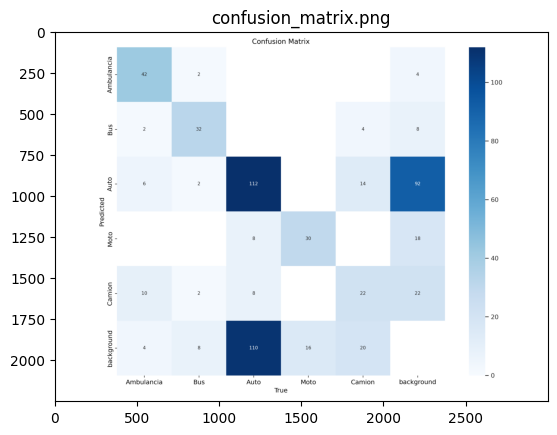

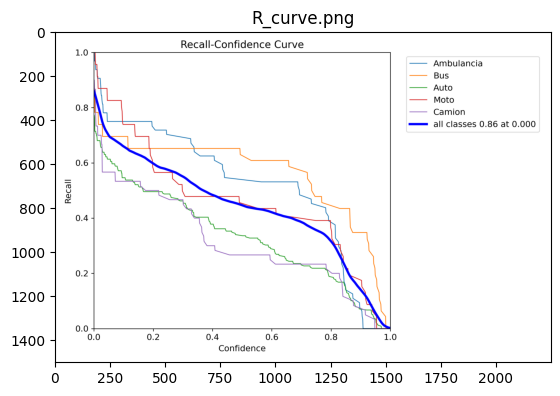

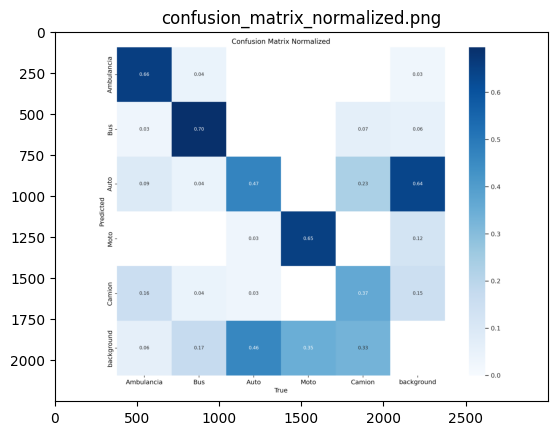

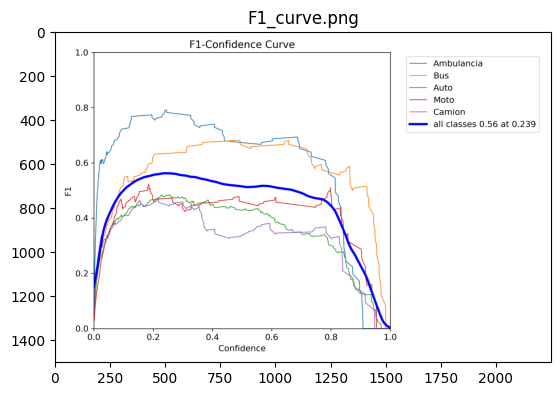

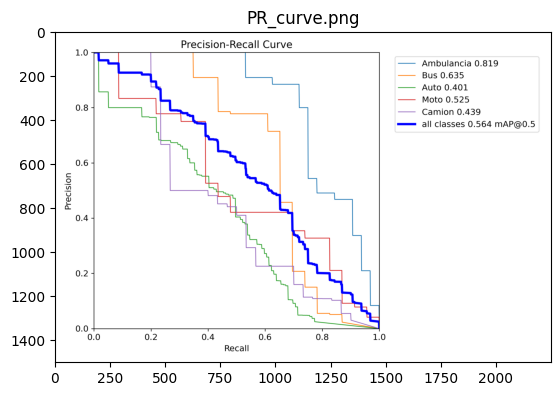

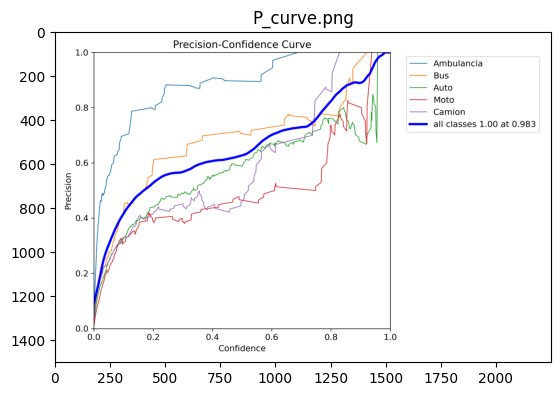

Results from /content/runs/detect/train22:


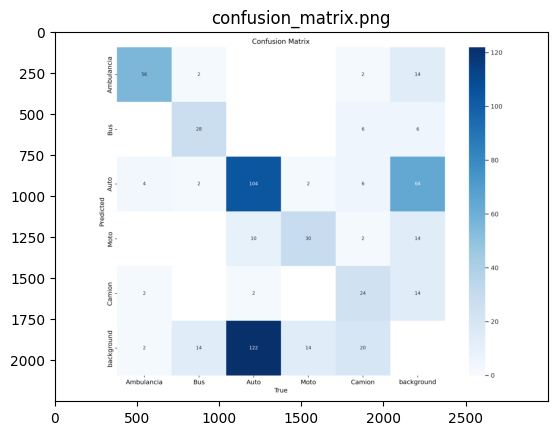

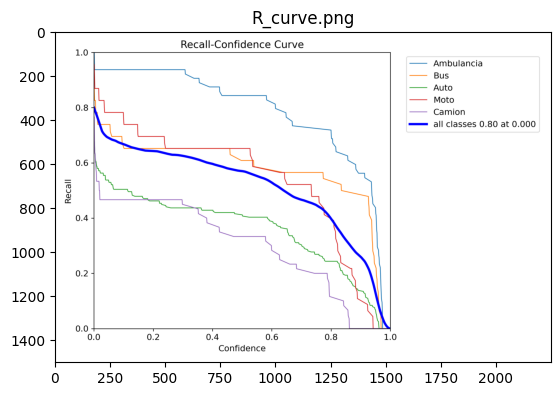

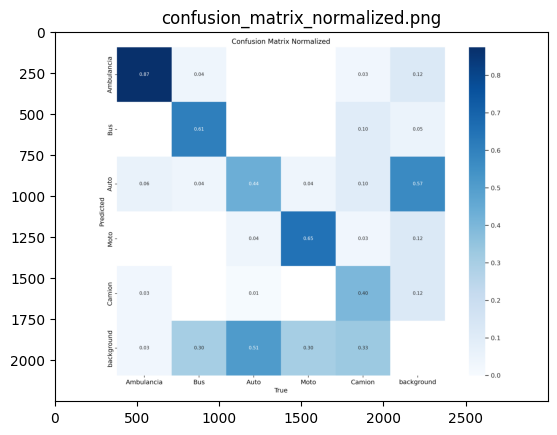

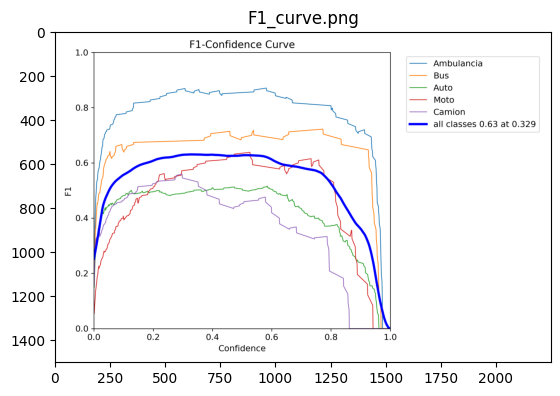

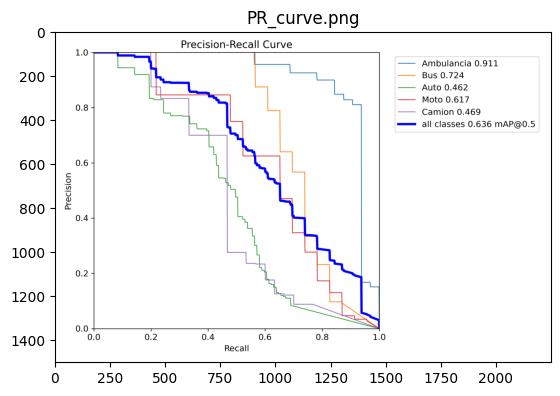

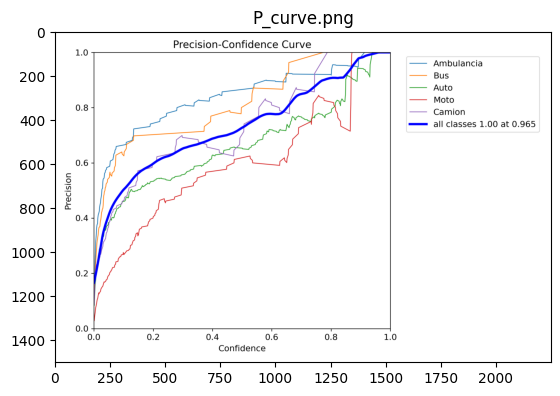

Results from /content/runs/detect/train32:


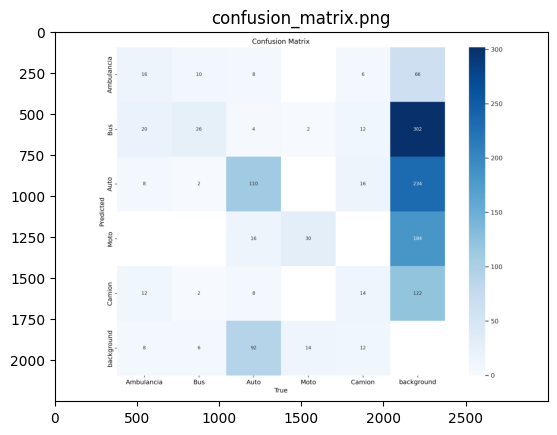

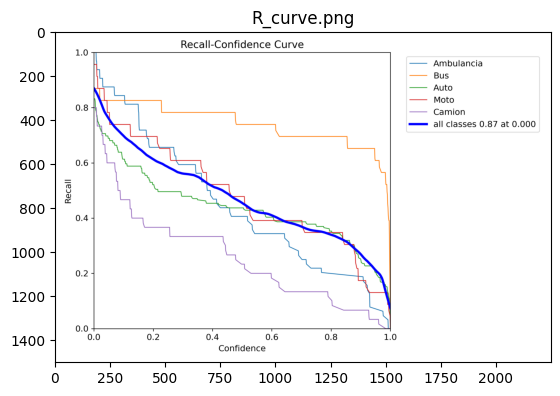

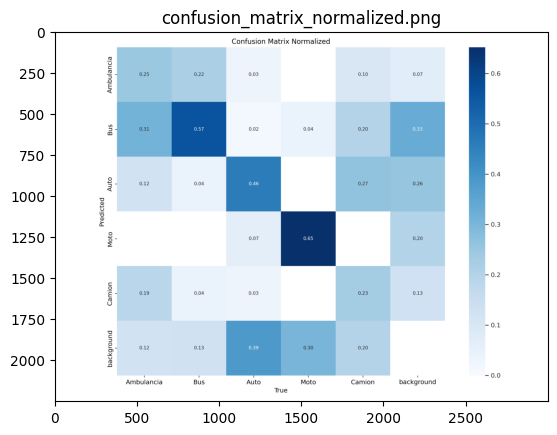

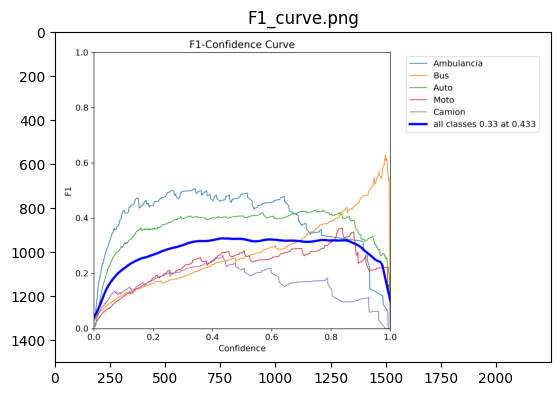

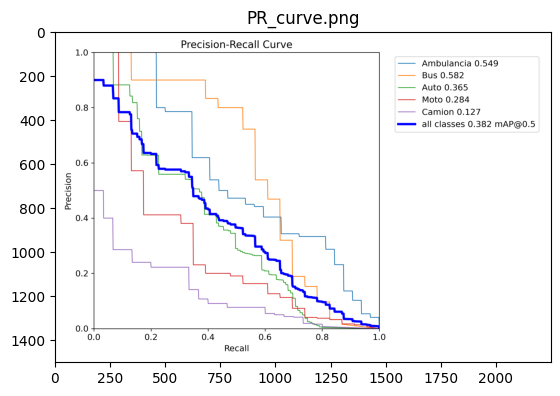

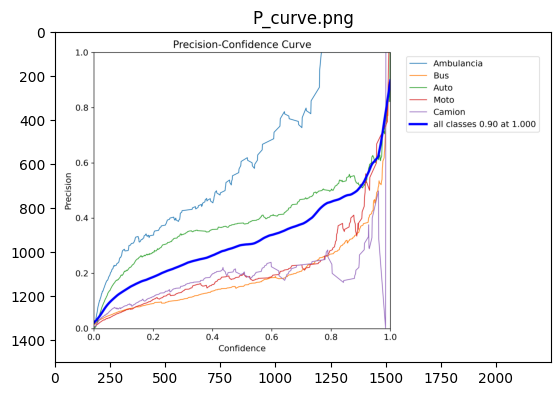

In [ ]:
# Imprimimos los resultados de las métricas para cada modelo
folders = ['/content/runs/detect/train4',
           '/content/runs/detect/train22',
           '/content/runs/detect/train32']

for folder in folders:
    print(f"Results from {folder}:")
    for file_name in os.listdir(folder):
        if file_name.endswith('.png'):
            img = mpimg.imread(os.path.join(folder, file_name))
            imgplot = plt.imshow(img)
            plt.title(file_name)
            plt.show()

Results from /content/runs/detect/train4:


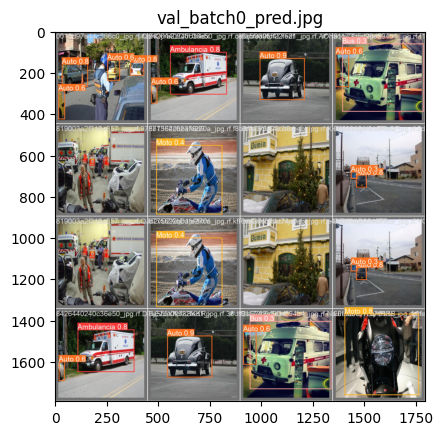

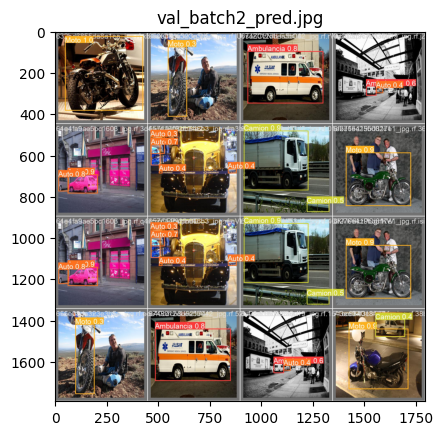

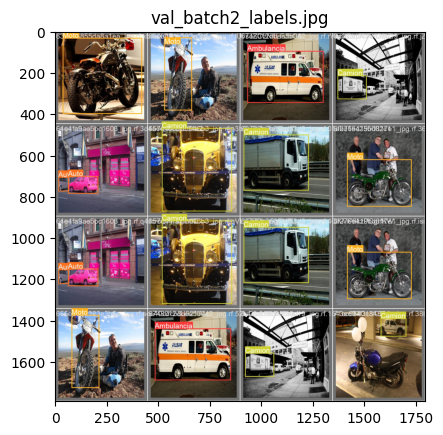

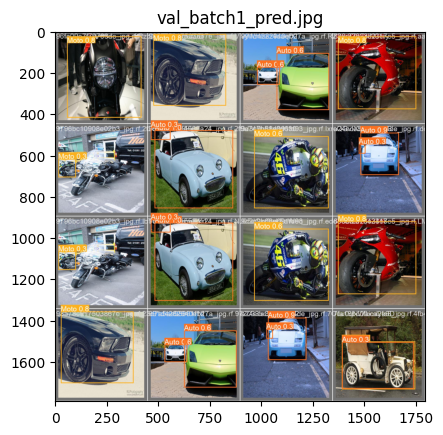

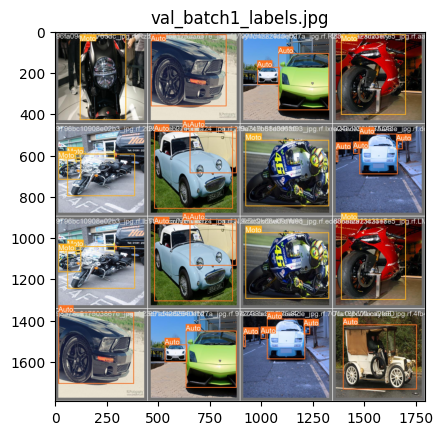

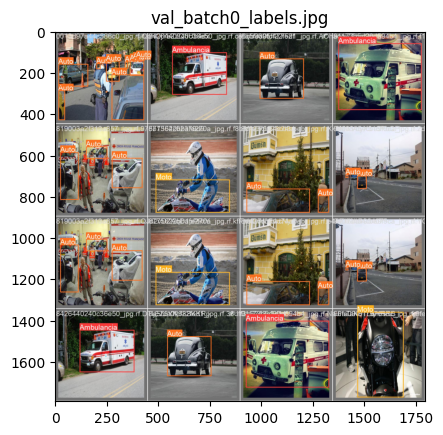

Results from /content/runs/detect/train22:


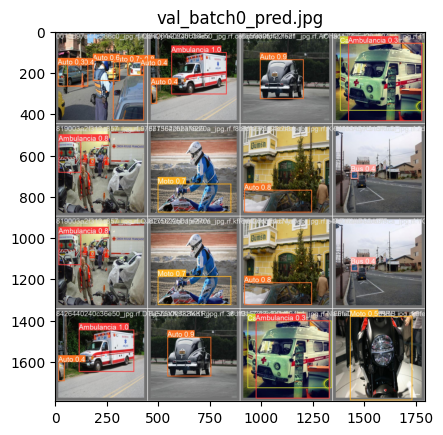

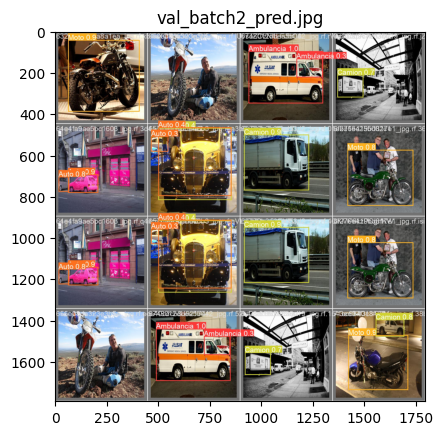

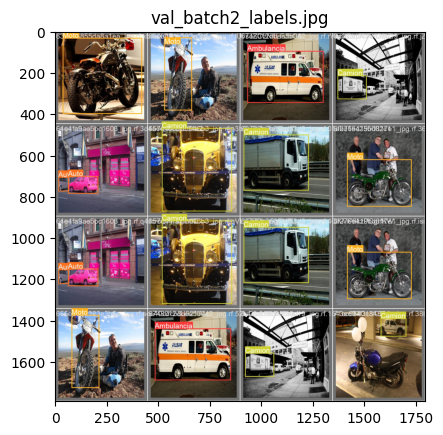

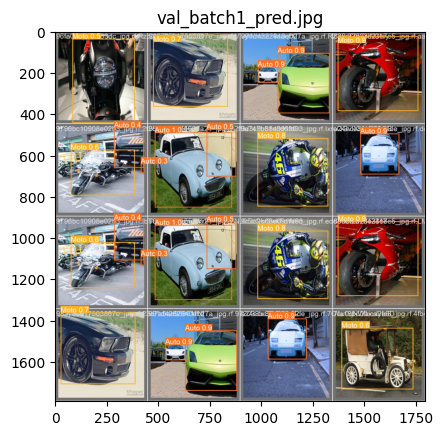

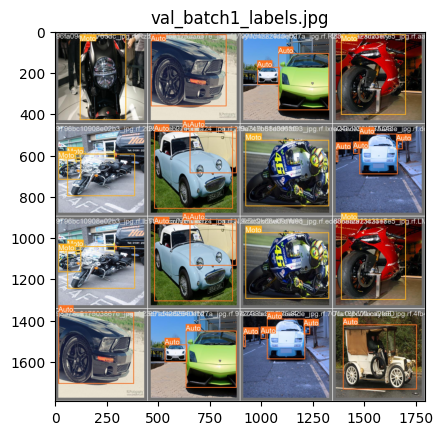

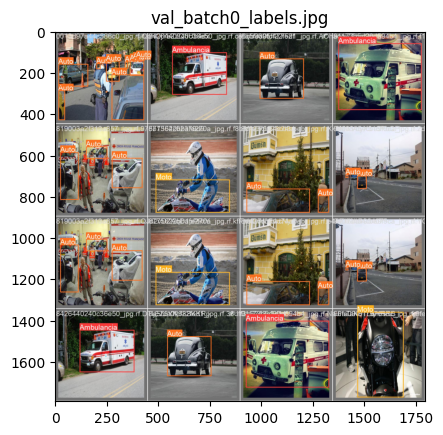

Results from /content/runs/detect/train32:


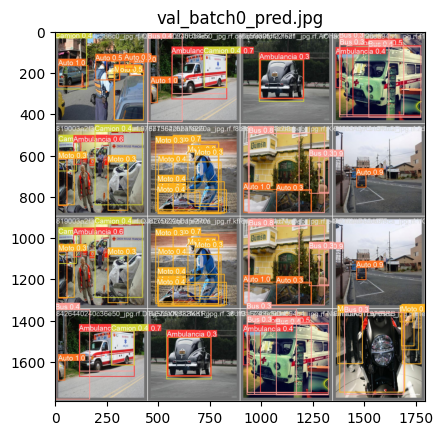

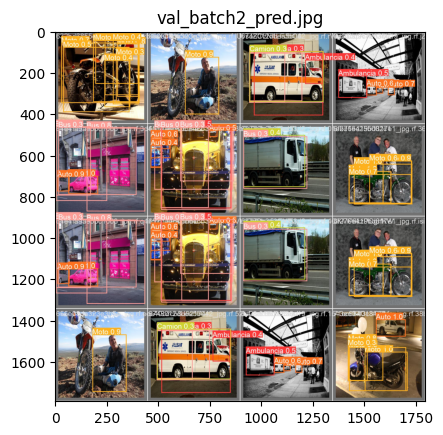

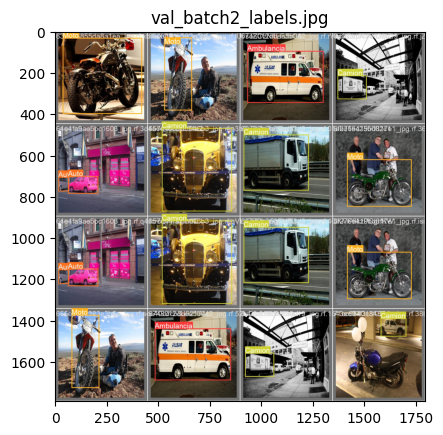

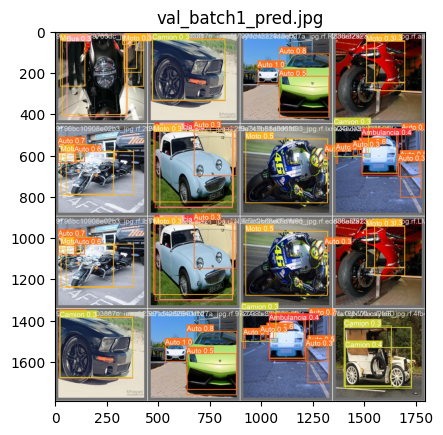

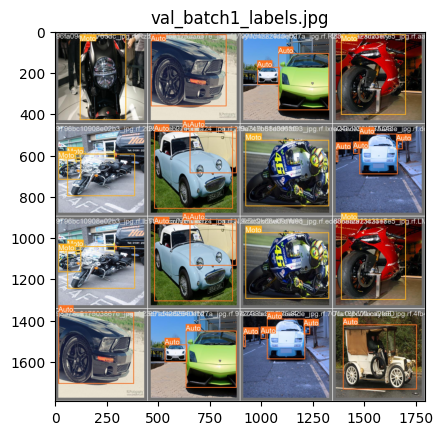

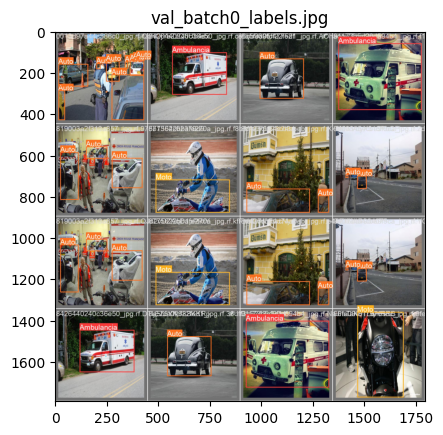

In [ ]:
# Imprimimos los resultados de las métricas para cada modelo
folders = ['/content/runs/detect/train4',
           '/content/runs/detect/train22',
           '/content/runs/detect/train32']

for folder in folders:
    print(f"Results from {folder}:")
    for file_name in os.listdir(folder):
        if file_name.endswith('.jpg'):
            img = mpimg.imread(os.path.join(folder, file_name))
            imgplot = plt.imshow(img)
            plt.title(file_name)
            plt.show()

In [ ]:
# Mostramos los resultados de las métricas
print("YOLOv8n Metrics:", metrics_v8n)
print("YOLOv8s Metrics:", metrics_v8s)
print("YOLOv8m Metrics:", metrics_v8m)

YOLOv8n Metrics: ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7e3d7b930be0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0

<hr/>
<div class="alert alert-info alertinfo" style="margin-top: 20px">
    <h2> TESTEO DEL MODELO </h2>   
</div>
<hr/>

## Predicción de los modelos

In [ ]:
# Visualizamos los resultados de YOLOv8n
results_v8n = model_v8n.predict(source='/content/drive/My Drive/Cars Detection/test/images', save=True)

# Visualizamos los resultados de YOLOv8s
results_v8s = model_v8s.predict(source='/content/drive/My Drive/Cars Detection/test/images', save=True)

# Visualizamos los resultados de YOLOv8m
results_v8m = model_v8m.predict(source='/content/drive/My Drive/Cars Detection/test/images', save=True)


image 1/126 /content/drive/My Drive/Cars Detection/test/images/00dea1edf14f09ab_jpg.rf.3f17c8790a68659d03b1939a59ccda80.jpg: 416x416 1 Ambulancia, 7.8ms
image 2/126 /content/drive/My Drive/Cars Detection/test/images/00dea1edf14f09ab_jpg.rf.KJ730oDTFPdXdJxvSLnX.jpg: 416x416 1 Ambulancia, 21.3ms
image 3/126 /content/drive/My Drive/Cars Detection/test/images/00e481ea1a520175_jpg.rf.6e6a8b3b45c9a11d106958f88ff714ea.jpg: 416x416 2 Buss, 6.7ms
image 4/126 /content/drive/My Drive/Cars Detection/test/images/00e481ea1a520175_jpg.rf.MV6sZ8QCFwFeMYaI2tHm.jpg: 416x416 2 Buss, 6.3ms
image 5/126 /content/drive/My Drive/Cars Detection/test/images/08c8b73e0c2e296e_jpg.rf.7IkYAamjZhnwsoXSrwKt.jpg: 416x416 1 Bus, 6.3ms
image 6/126 /content/drive/My Drive/Cars Detection/test/images/08c8b73e0c2e296e_jpg.rf.effa65856584463c08848031cab357b9.jpg: 416x416 1 Bus, 6.1ms
image 7/126 /content/drive/My Drive/Cars Detection/test/images/10c26c6598677a1f_jpg.rf.USCbBYVcUICkLhuq07Lw.jpg: 416x416 1 Moto, 5.9ms
image 8

Results from /content/runs/detect/train6:


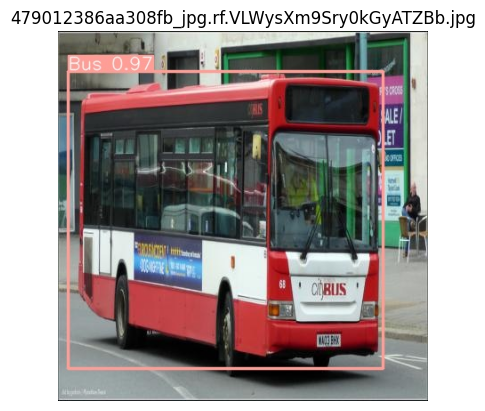

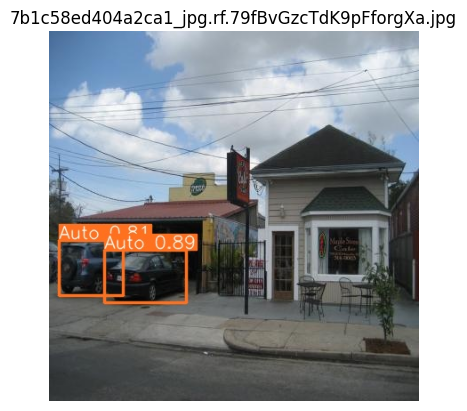

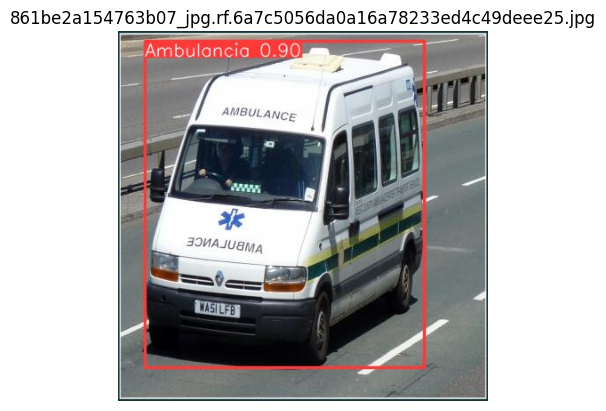

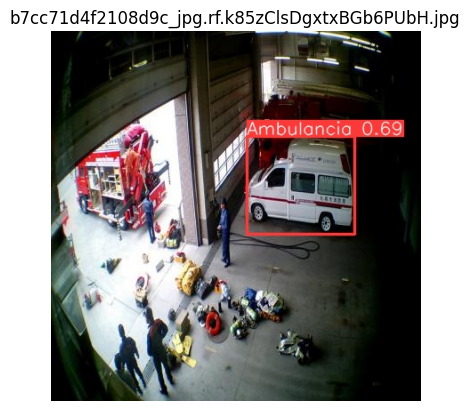

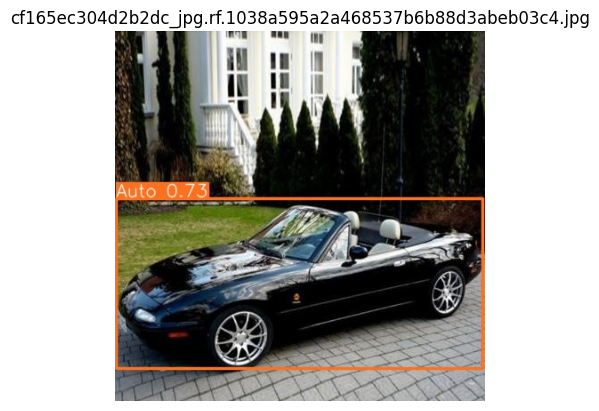

Results from /content/runs/detect/train24:


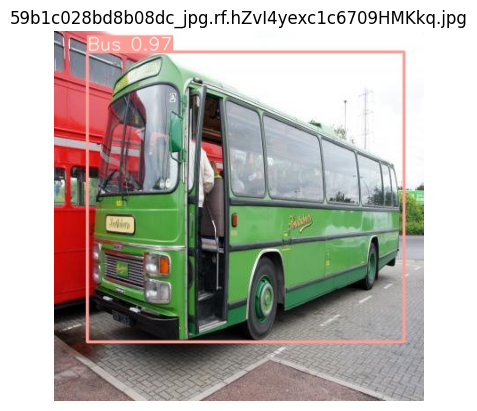

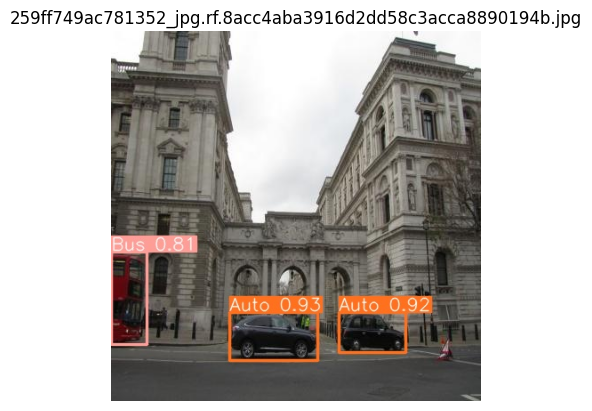

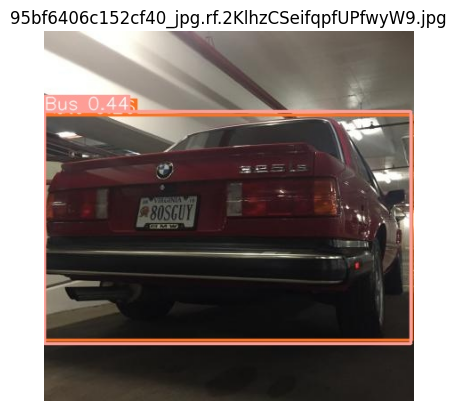

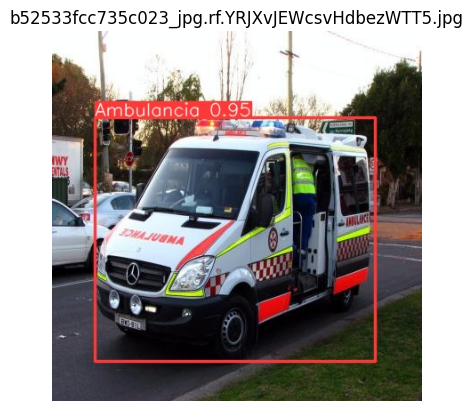

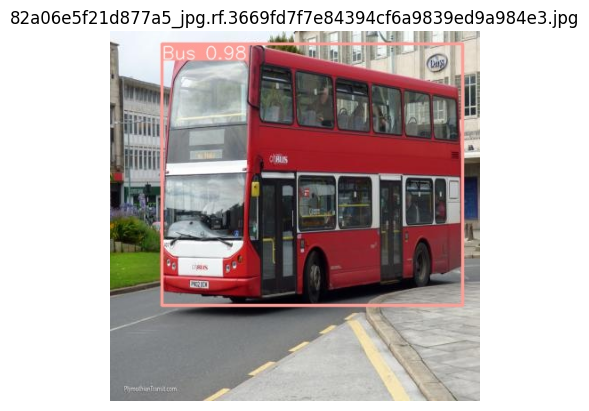

Results from /content/runs/detect/train34:


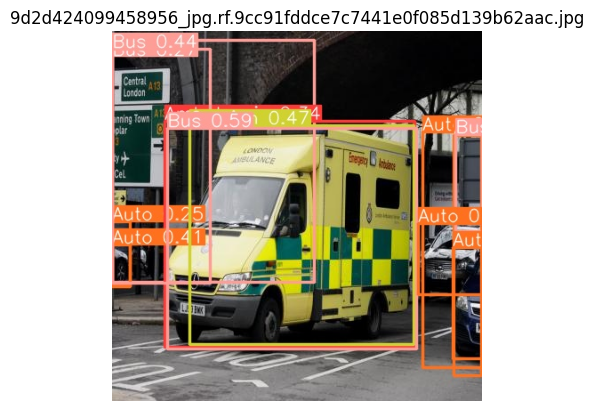

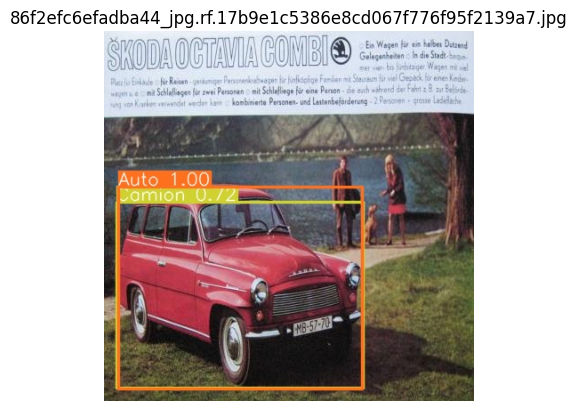

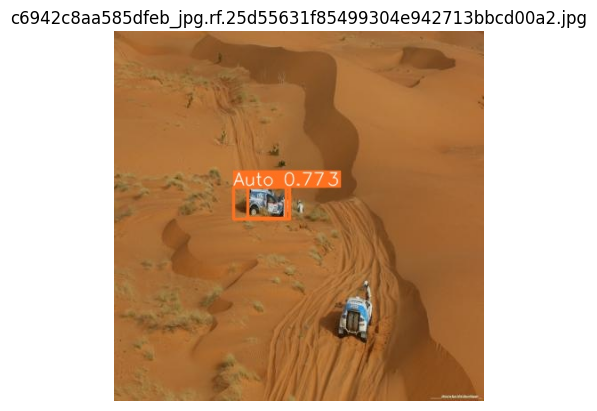

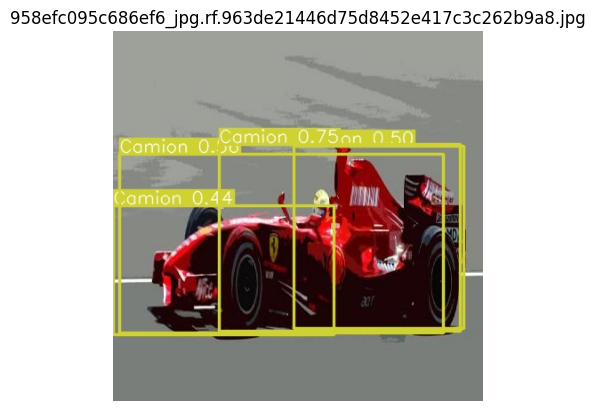

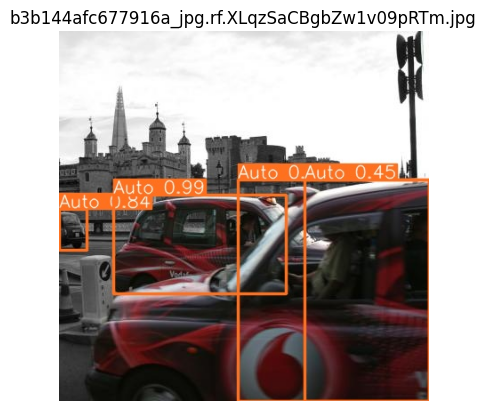

In [ ]:
# Imprimimos los primeros 5 resultados de cada predicción del modelo
folders = ['/content/runs/detect/train6',
           '/content/runs/detect/train24',
           '/content/runs/detect/train34']

num_images_to_show = 5

for folder in folders:
    print(f"Results from {folder}:")

    all_files = [f for f in os.listdir(folder) if f.endswith('.jpg')]

    selected_files = random.sample(all_files, num_images_to_show)

    for file_name in selected_files:
        img_path = os.path.join(folder, file_name)
        img = mpimg.imread(img_path)
        plt.imshow(img)
        plt.title(file_name)
        plt.axis('off')
        plt.show()